In [1]:
!pip install -q rasterio
!pip install -q geopandas
!pip install git+https://github.com/tensorflow/examples.git
!pip install -U tfds-nightly
!pip install focal-loss
!pip install tensorflow-addons
!pip install tensorflow==2.13.0

  Cloning https://github.com/tensorflow/examples.git to /tmp/pip-req-build-a3j3jglv
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/examples.git /tmp/pip-req-build-a3j3jglv
  Resolved https://github.com/tensorflow/examples.git to commit fff4bcda7201645a1efaea4534403daf5fc03d42
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 12.4 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: tfds-nightly
    Found existing installation: tfds-nightly 4.9.4.dev202402070044
    Uninstalling tfds-nightly-4.9.4.dev202402070044:
      Successfully uninstalled tfds-nightly-4.9.4.dev202402070044


In [8]:
import os, glob, functools, fnmatch
from zipfile import ZipFile
from itertools import product

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['axes.grid'] = False
mpl.rcParams['figure.figsize'] = (12, 12)

from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
import pandas as pd
from PIL import Image

import rasterio
from rasterio import features, mask, windows

import geopandas as gpd

import tensorflow as tf
from tensorflow.python.keras import layers, losses, models
from tensorflow.python.keras import backend as K  
import tensorflow_addons as tfa

from tensorflow_examples.models.pix2pix import pix2pix

import tensorflow_datasets as tfds
tfds.disable_progress_bar()

from IPython.display import clear_output

from focal_loss import SparseCategoricalFocalLoss
from sklearn.metrics import confusion_matrix, f1_score

2024-02-13 19:11:20.371923: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-02-13 19:11:20.424445: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-02-13 19:11:20.425718: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-13 19:11:21.398058: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please mod

In [9]:
root_dir = 'images/'
sentinel_timestamps = ['2017-03-22', '2017-05-31', '2017-06-20', '2017-08-04']
test_sentinel_timestamp = ['2017-07-10']
target_crs = 'epsg:32734'

In [10]:
class_index = pd.read_csv('crop_id_list.csv')
class_names = class_index.crop.unique()
print(class_index)

   crop_id                            crop
0        1                          Cotton
1        2                           Dates
2        3                           Grass
3        4                          Lucern
4        5                           Maize
5        6                           Pecan
6        7                          Vacant
7        8                        Vineyard
8        9  Vineyard & Pecan ("Intercrop")


In [83]:
def sentinel_read(sentinel_timestamp):
    sentinel_dir = os.path.join(root_dir, sentinel_timestamp)
    # print(sentinel_dir+'/**/*.jp2')
    # returns the paths of all .jp2 images
    bands = glob.glob(sentinel_dir+'/**/*.jp2', recursive=True)
    # Read band metadata and arrays
    # metadata
    # filter from the whole path the specific band path
    src_2 = rasterio.open(fnmatch.filter(bands, '*B02.jp2')[0])  # blue
    src_3 = rasterio.open(fnmatch.filter(bands, '*B03.jp2')[0])  # green
    src_4 = rasterio.open(fnmatch.filter(bands, '*B04.jp2')[0])  # red
    src_8 = rasterio.open(fnmatch.filter(bands, '*B08.jp2')[0])  # near infrared

    # array
    # read the specific band image
    arr_2 = src_2.read()
    arr_3 = src_3.read()
    arr_4 = src_4.read()
    arr_8 = src_8.read()

    return sentinel_dir, arr_2, arr_3, arr_4, arr_8, src_8

In [101]:
def indexnormstack(red, nir):

    def NDVIcalc(nir, red):
        ndvi = (nir - red) / (nir + red + 1e-5)
        return ndvi

    def WRDVIcalc(red, nir):
        a = 0.2
        wdrvi = (a * nir - red) / (a * nir + red)
        return wdrvi

    def SAVIcalc(red, nir):
        savi = 1.5 * (nir - red) / (nir + red + 0.5)
        return savi

    def norm(arr):
        arr_norm = (255*(arr - np.min(arr))/np.ptp(arr))
        return arr_norm

    ndvi = NDVIcalc(nir, red)
    savi = SAVIcalc(red, nir)

    wdrvi = WRDVIcalc(red, nir)

    ndvi = ndvi.transpose(1, 2, 0)
    savi = savi.transpose(1, 2, 0)
    wdrvi = wdrvi.transpose(1, 2, 0)

    index_stack = np.dstack((ndvi, savi, wdrvi))

    return index_stack

In [262]:
def label(geo, src_8):
    geo = gpd.read_file(geo)
    # check for and remove invalid geometries
    geo = geo.loc[geo.is_valid]
    # reproject training data into local coordinate reference system
    geo = geo.to_crs(crs = target_crs)
    # convert the class identifier column to type integer(double the column)
    geo['Crop_Id_Ne_int'] = geo.Crop_Id_Ne.astype(int)
    # pair the geometries and their integer class values
    shapes = ((geom, cropId) for geom, cropId in zip(geo.geometry, geo.Crop_Id_Ne_int))
    for shape in shapes:
        print(shape[0])
        # Extract the coordinates of the polygon
        x, y = shape[0].exterior.xy

        # Plot the polygon
        plt.plot(x, y)
        plt.fill(x, y, alpha=0.5)  # Fill the polygon
        plt.xlabel('X Coordinate')
        plt.ylabel('Y Coordinate')
        plt.title('Polygon Plot')
        plt.grid(True)
        plt.gca().set_aspect('equal', adjustable='box')
        plt.show()

    # get the metadata (height, width, channels, transform,
    # CRS) to use in constructing the labeled image array
    src_8_prf = src_8.profile
    # construct a blank array from the metadata and burn the labels in it (convert vector geometries (shapes) into a raster grid)
    labels = features.rasterize(shapes=shapes, out_shape=(src_8_prf['height'], src_8_prf['width']), fill=0, all_touched=True, transform=src_8_prf['transform'], dtype=src_8_prf['dtype'])
    print("Values in labeled image: ", np.unique(labels))
    return labels

In [ ]:
def save_images(sentinel_dir, index_stack, labels, src_8):
    index_stack = (index_stack * 255).astype(np.uint8)
    index_stack_t = index_stack.transpose(2, 0, 1)

    index_stack_out = rasterio.open(sentinel_dir+'/index_stack.tiff', 'w',
                                    driver='Gtiff',
                                    width=src_8.width, height=src_8.height,
                                    count=3,
                                    crs=src_8.crs,
                                    transform=src_8.transform,
                                    dtype='uint8')

    index_stack_out.write(index_stack_t)
    index_stack_out.close()

    labels = labels.astype(np.uint8)
    labels_out = rasterio.open(sentinel_dir+'/labels.tiff', 'w',
                               driver='Gtiff',
                               width=src_8.width, height=src_8.height,
                               count=1,
                               crs=src_8.crs,
                               transform=src_8.transform,
                               dtype='uint8')

    labels_out.write(labels, 1)
    labels_out.close()

    return sentinel_dir+'/index_stack.tiff', sentinel_dir+'/labels.tiff'


# Now let's divide the Sentinel 2 index stack and labeled image into 224x224 pixel tiles
def tile(index_stack, labels, sentinel_timestamp):
    tiles_dir = root_dir+'tiled/'
    img_dir = root_dir+'tiled/images/'
    label_dir = root_dir+'tiled/labels/'
    dirs = [tiles_dir, img_dir, label_dir]
    for d in dirs:
        if not os.path.exists(d):
            os.makedirs(d)

    # set tile height and width
    # height ,width = 224, 224

    def get_tiles(ds, width=224, height=224):
        # get number of rows and columns (pixels) in the entire input image
        nols, nrows = ds.meta['width'], ds.meta['height']
        # get the grid from which tiles will be made
        offsets = product(range(0, nols, width), range(0, nrows, height))
        # get the window of the entire input image
        big_window = windows.Window(col_off=0, row_off=0, width=nols, height=nrows)
        # tile the big window by mini-windows per grid cell
        for col_off, row_off in offsets:
            window = windows.Window(col_off=col_off, row_off=row_off, width=width, height=height).intersection(big_window)
            transform = windows.transform(window, ds.transform)
            yield window, transform

    # tile_width, tile_height = 224, 224
    
    def crop(inpath, outpath, c):
        # read input image
        image = rasterio.open(inpath)
        # get the metadata
        meta = image.meta.copy()
        # set the number of channels to 3 or 1, depending on if its the index image or labels image
        meta['count'] = int(c)
        # set the tile output file format to PNG (saves spatial metadata unlike JPG)
        meta['driver'] = 'PNG'
        # tile the input image by the mini-windows
        i = 0
        for window, transform in get_tiles(image):
            meta['transform'] = transform
            meta['width'], meta['height'] = window.width, window.height
            outfile = outpath+"tile_%s_%s.png" % (sentinel_timestamp, str(i))
            with rasterio.open(outfile, 'w', **meta) as outds:
                outds.write(image.read(window=window))
            i = i+1

    def process_tiles(index_flag):
        # tile the input images, when index_flag is True, we are tiling the spectral index image,
        # when False we are tiling the labels image
        if index_flag is True:
            inpath = sentinel_dir+'/index_stack.tiff'
            outpath = img_dir
            crop(inpath, outpath, 3)
        else:
            inpath = sentinel_dir+'/labels.tiff'
            outpath = label_dir
            crop(inpath, outpath, 1)

    process_tiles(index_flag=True)  # tile index stack
    process_tiles(index_flag=False)  # tile labels
    return tiles_dir, img_dir, label_dir

In [14]:
# import zipfile

# # Path to the zip file containing Sentinel-SAFE data
# for root, dirs, files in os.walk("images"):
#     for file_name in files:
#         if file_name.endswith('.zip'):
#             zip_file_path = 'images/' + file_name
#             extracted_dir = 'images/' + file_name[:-4]

#             with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
#                 zip_ref.extractall(extracted_dir)
#             print(file_name)

# Find and open band 2 data within the extracted directory
# for root, dirs, files in os.walk(extracted_dir):
#     for file_name in files:
#         if file_name.endswith('_B01.jp2'):
#             band2_path = os.path.join(root, file_name)
#             with rasterio.open(band2_path) as dataset:
#                 # Read metadata
#                 print(dataset.profile)

#                 # Read band 2 data
#                 band2_data = dataset.read(1)  # Assuming band 2 is the first band (index 1-based)
                # If you need to apply any transformation to the data (e.g., scaling), you can do it here

# Now you have band 2 data in the 'band2_data' variable, which you can use for further processing or visualization

timestamp:  2017-03-22
images/2017-03-22/**/*.jp2
POLYGON ((613924.3324000844 6793991.295069636, 614051.4955277118 6794016.207652537, 614055.2810487353 6793977.493040231, 613945.3997331301 6793920.2175259795, 613924.3324000844 6793991.295069636))


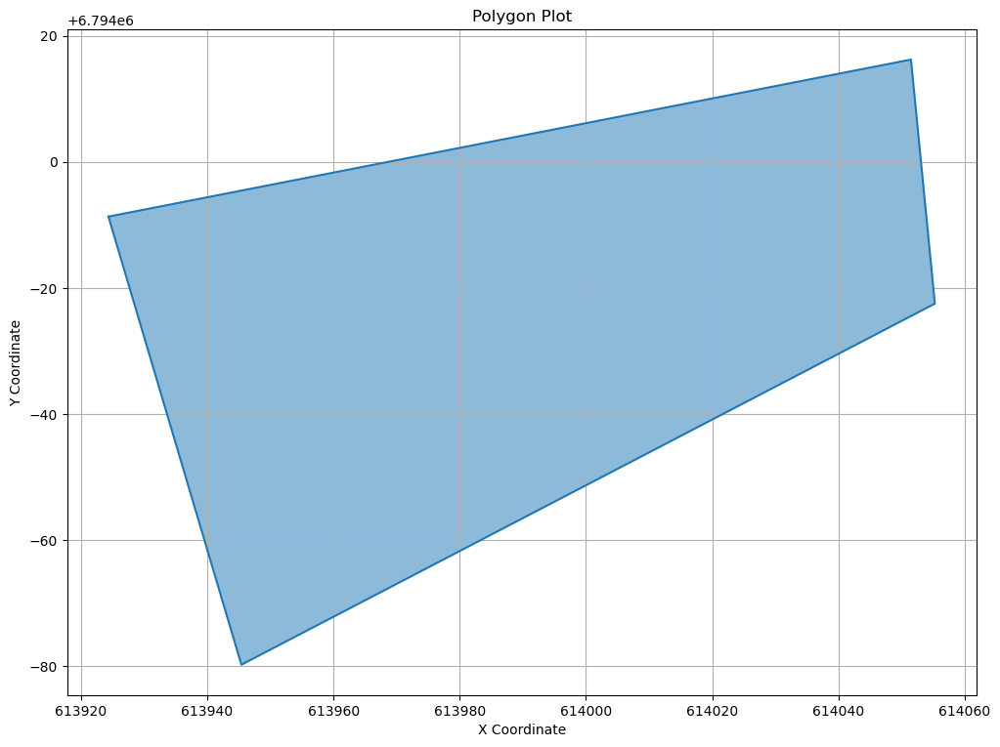

POLYGON ((614404.0717397585 6794020.579634484, 614332.9961299356 6794168.246460784, 614421.5688309195 6794200.367483403, 614498.1827948332 6794057.685113106, 614404.0717397585 6794020.579634484))


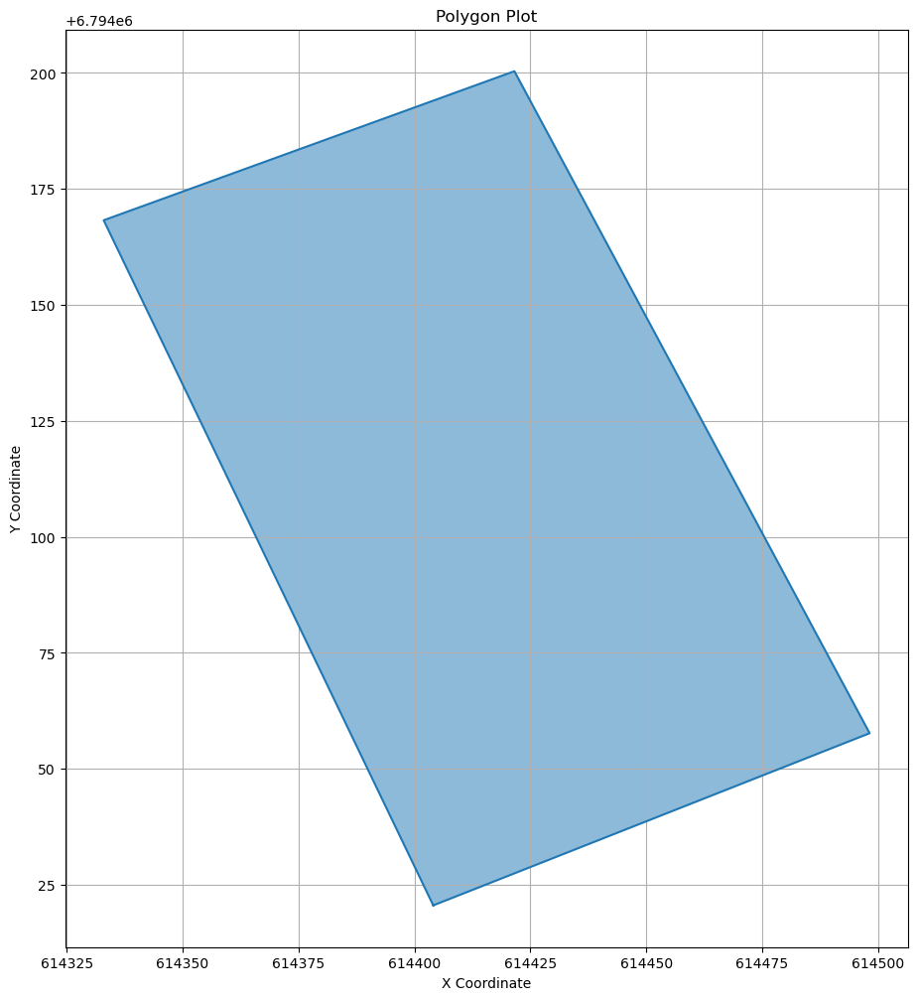

POLYGON ((614320.2146632315 6793964.242091117, 614322.6080357137 6793948.7012036685, 614298.1542093663 6793911.656484335, 614290.690022626 6793859.621076044, 614267.9360165605 6793853.825274835, 614223.9782505379 6793858.429956881, 614219.6380362506 6793864.494513618, 614215.103911243 6793944.440745598, 614320.2146632315 6793964.242091117))


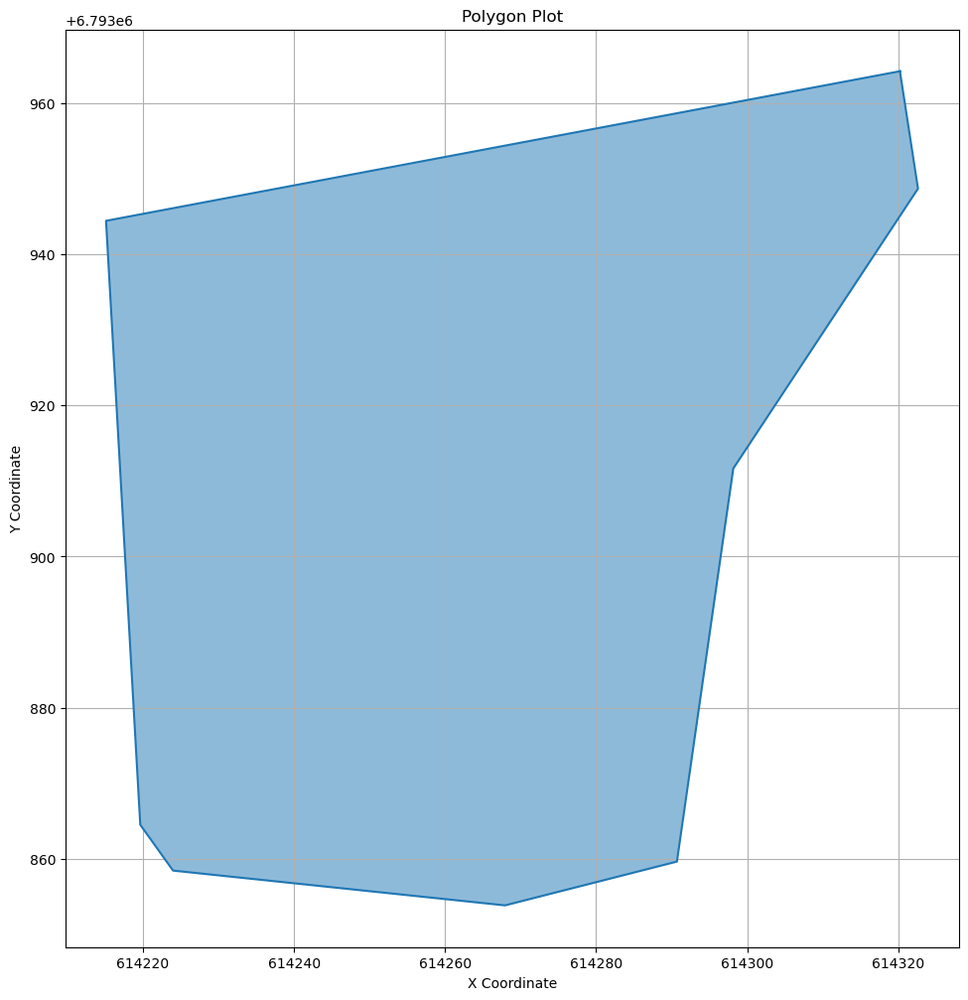

POLYGON ((614560.5326844398 6794002.249461824, 614551.3238657939 6793984.507827634, 614498.8314907948 6793922.729470385, 614492.5582326663 6793920.707431015, 614452.217966657 6793846.533808084, 614410.154263808 6793855.289131464, 614435.9364495664 6793909.458502607, 614433.6321967796 6793910.639382743, 614451.7786957427 6793942.188119788, 614457.3158153074 6793940.048718828, 614460.1545490476 6793946.042087064, 614463.8505644061 6793945.078969072, 614514.5901109977 6794040.22550997, 614520.2653850776 6794051.980751299, 614560.5326844398 6794002.249461824))


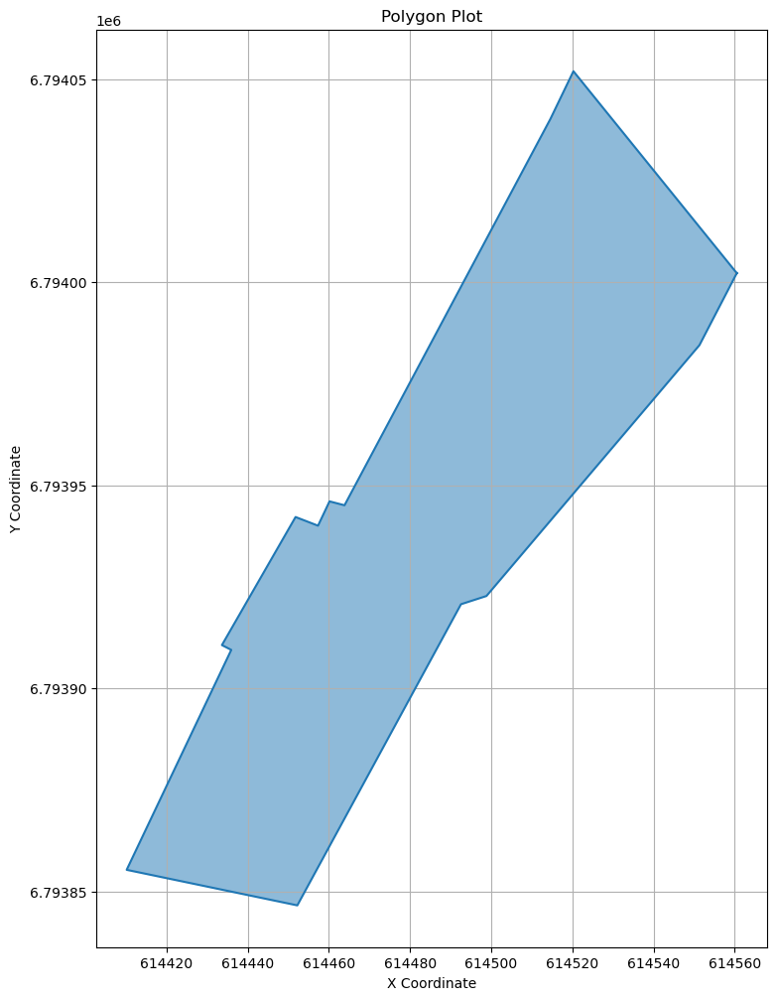

POLYGON ((614596.6564746546 6794269.86543625, 614460.1675535059 6794215.868558432, 614412.9161394904 6794308.748411167, 614382.3374712227 6794378.070885367, 614365.8374839056 6794372.444481198, 614357.8561370822 6794385.0305103585, 614353.9565180844 6794412.167351326, 614574.860853174 6794500.300530307, 614596.6564746546 6794269.86543625))


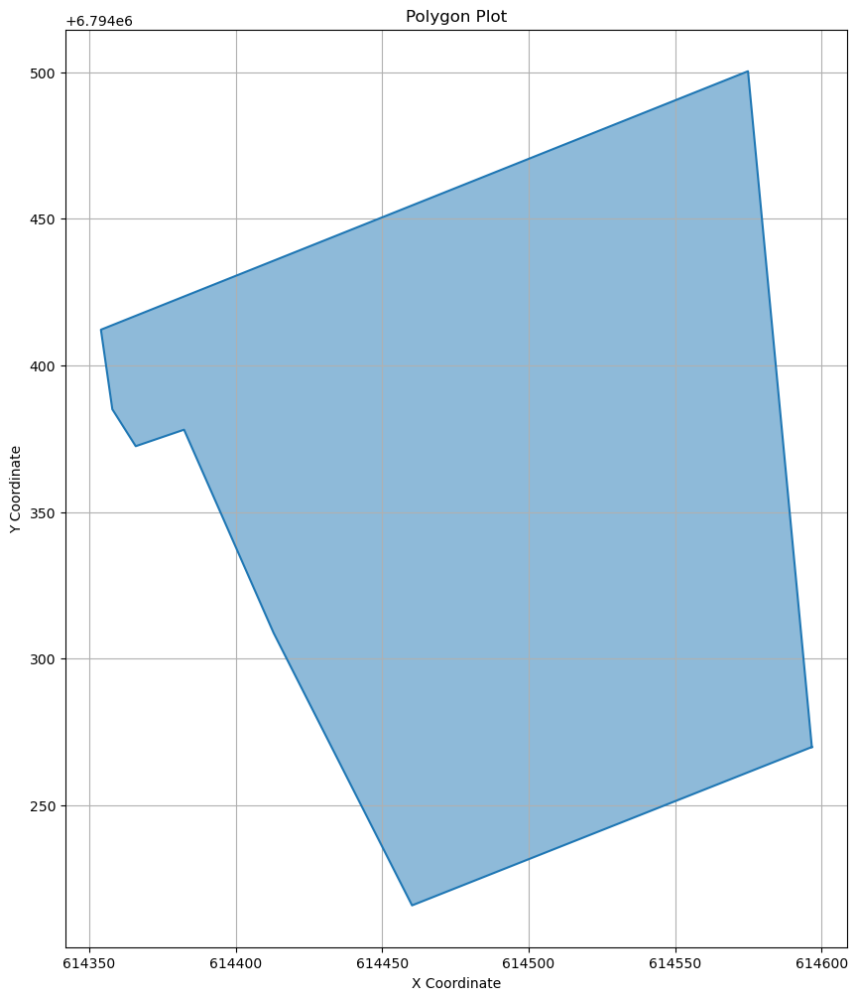

POLYGON ((614593.0732835423 6794503.419870963, 614627.0048526822 6794515.12612209, 614635.7523340813 6794416.604992721, 614644.5537747645 6794346.803421201, 614650.7938520324 6794275.638112428, 614653.3204397334 6794180.423353775, 614623.6941978723 6794182.339363656, 614593.0732835423 6794503.419870963))


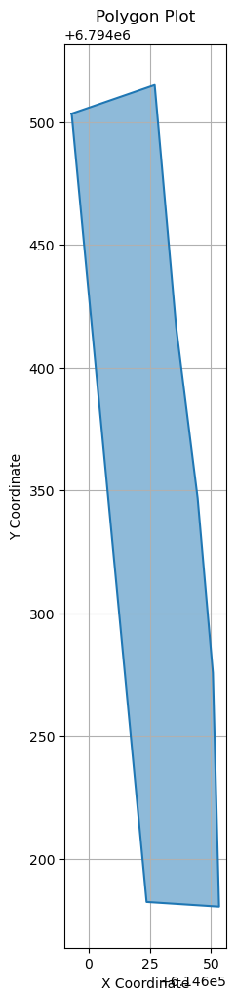

POLYGON ((614196.4868975071 6794344.478450581, 614342.2922130907 6794403.713604536, 614367.4235149183 6794345.5622991845, 614377.156945969 6794346.160502881, 614439.8780813472 6794225.102681766, 614256.4458621826 6794154.894423012, 614196.4868975071 6794344.478450581))


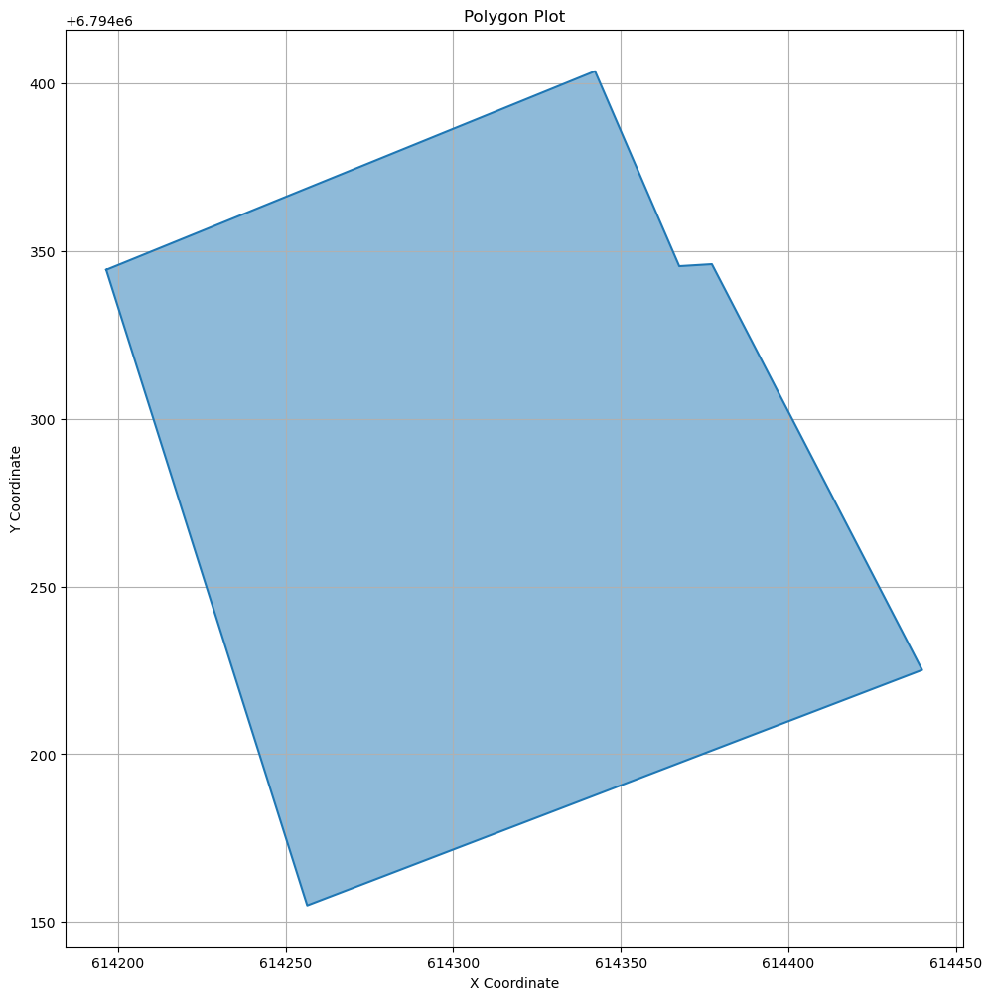

POLYGON ((614618.2041435265 6794524.48967627, 614589.2245913037 6794516.995779384, 614554.1948335855 6794655.755414008, 614533.1128861611 6794743.79309641, 614565.2411545799 6794760.427977411, 614618.2041435265 6794524.48967627))


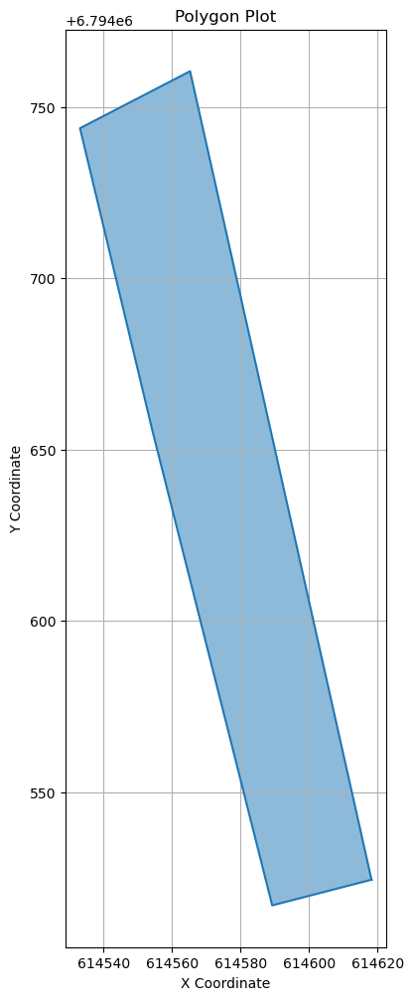

POLYGON ((614558.9018551788 6794772.778207043, 614522.5220426046 6794747.84739065, 614464.6364577301 6794824.299881678, 614371.3576216375 6794975.314540188, 614405.506173056 6794999.434662624, 614491.9428188307 6794887.121190654, 614517.9166076654 6794843.78225212, 614558.9018551788 6794772.778207043))


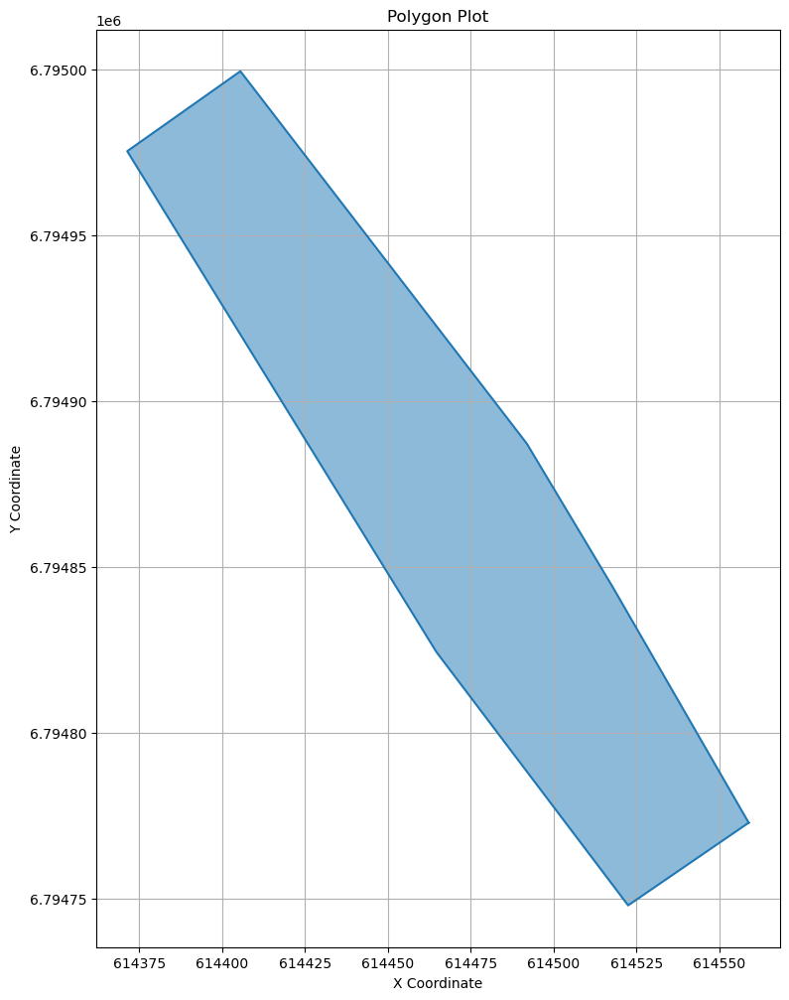

POLYGON ((614345.1097278214 6794972.4365474135, 614404.405749062 6794897.9153452795, 614253.7065843975 6794836.3177998, 614226.8215745506 6794928.026941, 614345.1097278214 6794972.4365474135))


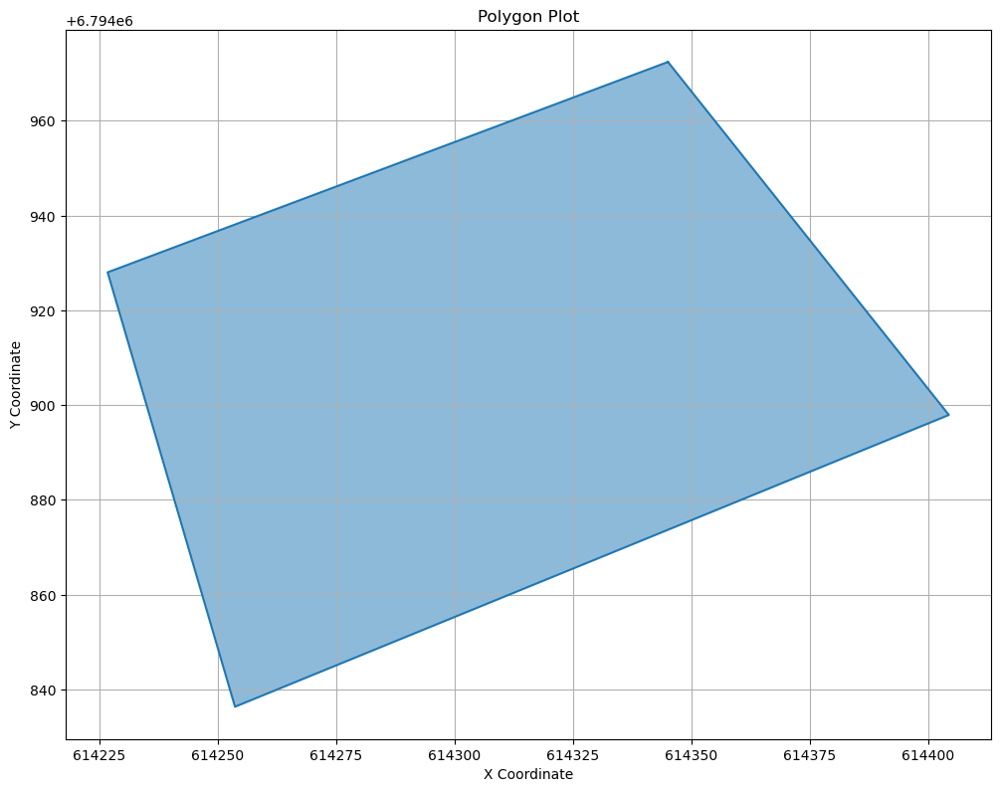

POLYGON ((612661.2527717095 6796841.37256946, 612737.8430827954 6796884.546059873, 612811.8952906041 6796753.446507253, 612776.4125287732 6796735.168612227, 612730.4772881173 6796785.098969191, 612669.7962069026 6796833.783477682, 612661.2527717095 6796841.37256946))


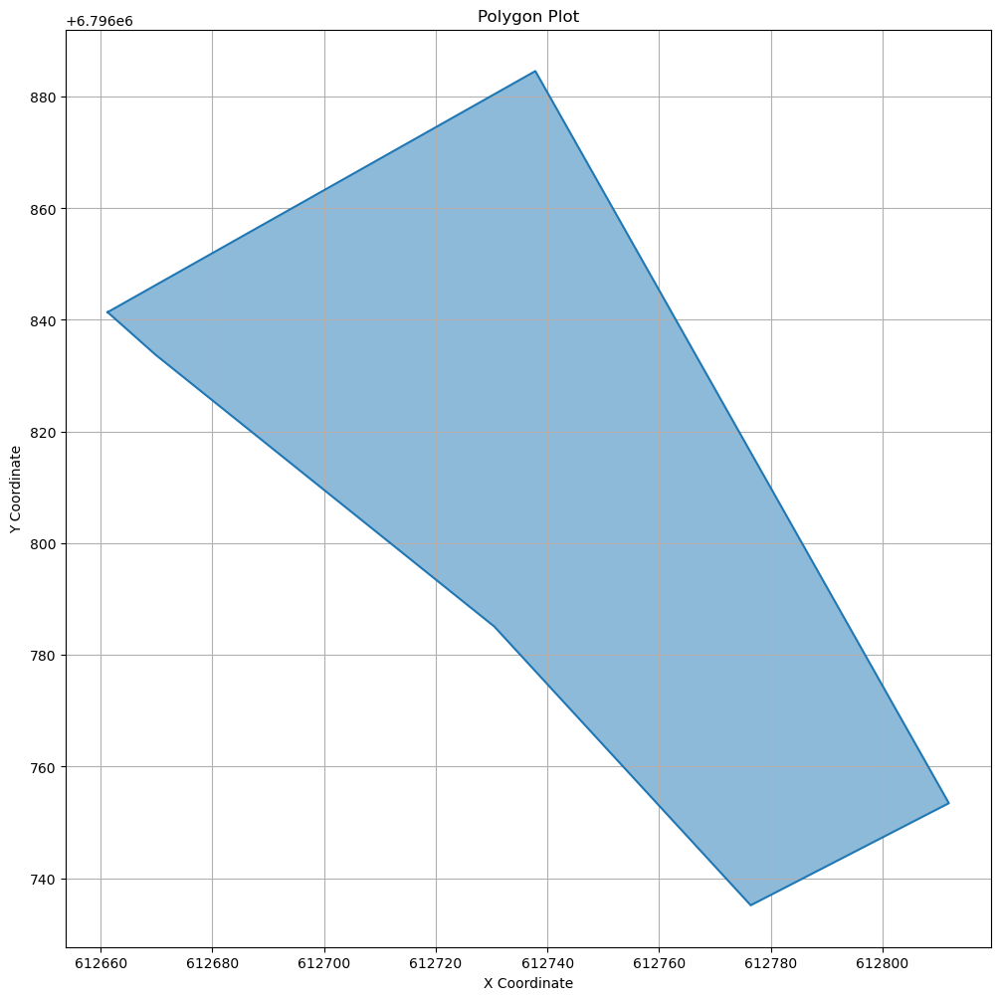

POLYGON ((612729.5638594383 6796915.802940741, 612740.9072305729 6796892.314194123, 612738.4451963765 6796889.265962405, 612661.2527717141 6796841.372569462, 612644.423689244 6796862.833741262, 612729.5638594383 6796915.802940741))


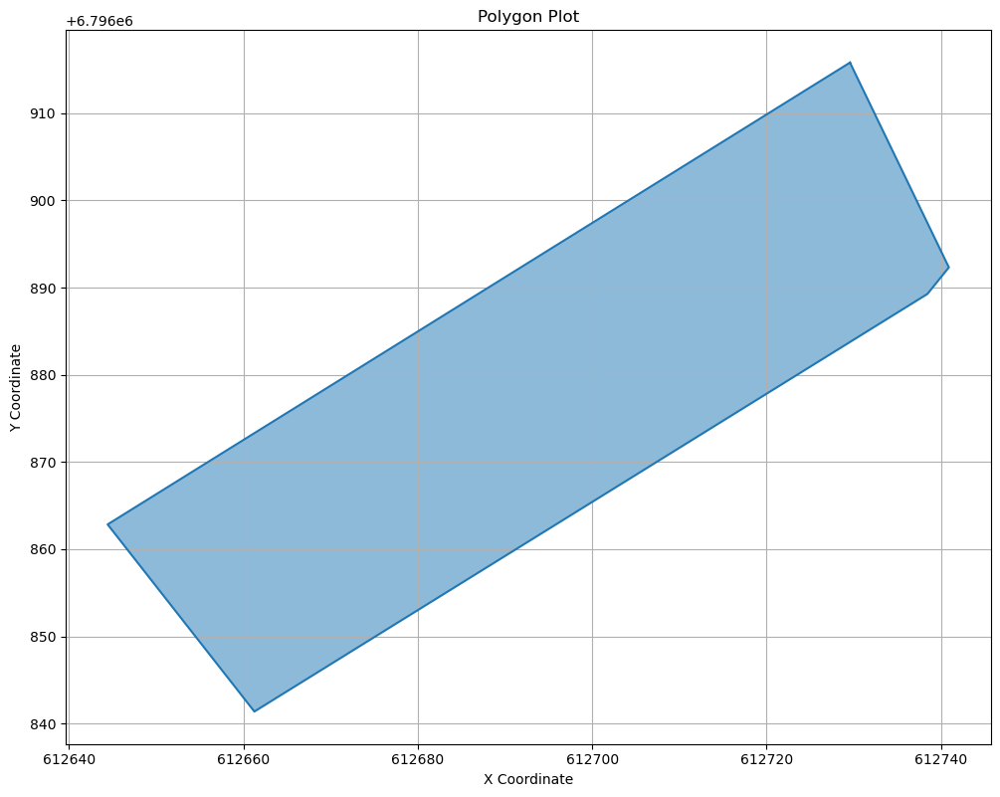

POLYGON ((614404.0717397585 6794020.579634484, 614381.8810762475 6794008.609606357, 614332.5632855633 6793983.313732276, 614259.1970994717 6794128.560651254, 614259.3257116644 6794141.529122744, 614332.9961299356 6794168.2464607805, 614404.0717397585 6794020.579634484))


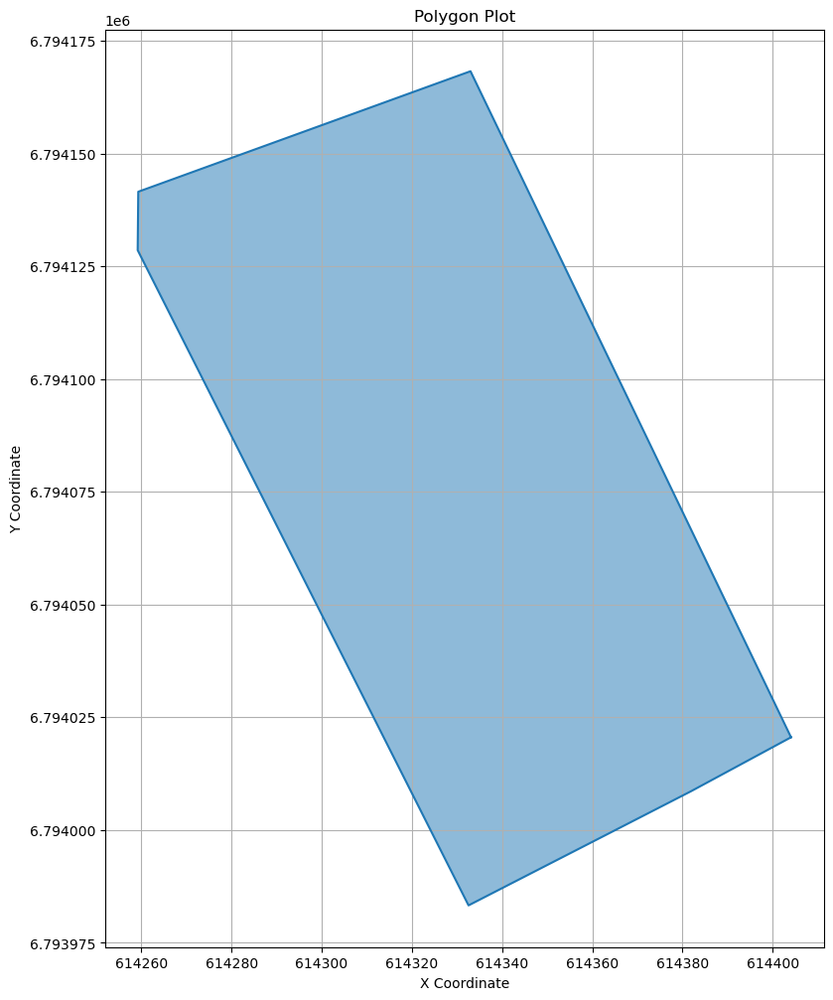

POLYGON ((614205.9086751587 6793518.410460489, 614268.5750601043 6793490.102700759, 614248.5734595426 6793472.107284304, 614242.8017421174 6793451.202081257, 614184.2369619028 6793331.940882521, 614174.4847074322 6793330.455488129, 614147.8423962217 6793344.167167073, 614141.3177322808 6793352.537702855, 614179.1287441847 6793518.28043288, 614203.0875413324 6793514.483253101, 614205.9086751587 6793518.410460489))


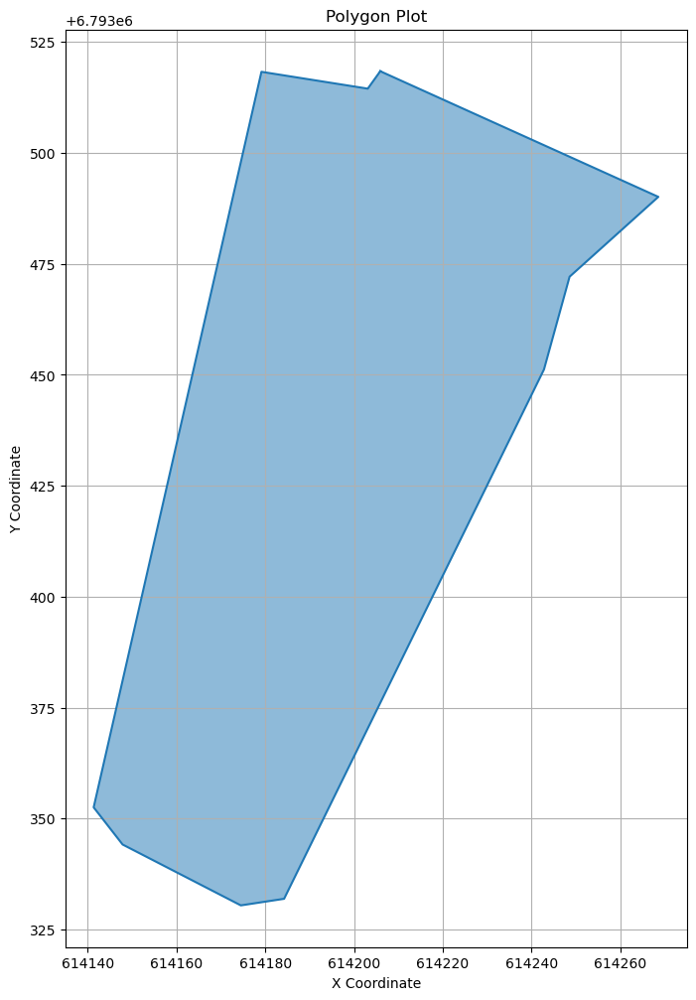

POLYGON ((587181.5345952254 6809191.442137215, 587301.0398236657 6809185.269227278, 587294.9052837169 6809025.8071944155, 587251.6227632612 6809019.542013986, 587225.7718185049 6809016.111498568, 587209.4785801015 6809010.302041622, 587199.2785710634 6809004.4466989245, 587183.325117927 6809005.225897634, 587181.5345952254 6809191.442137215))


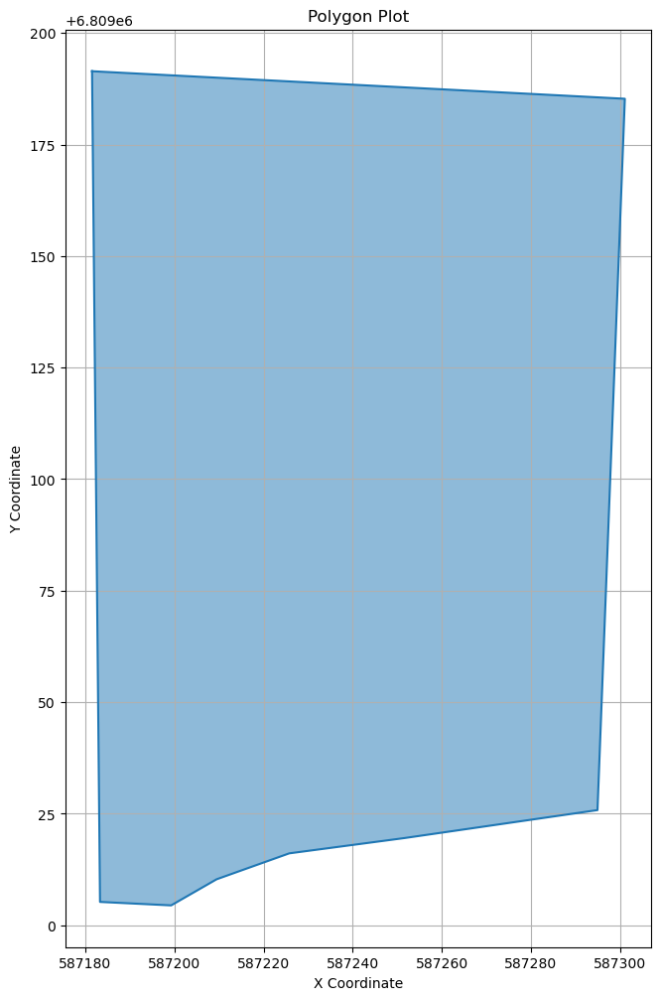

POLYGON ((587110.0128195387 6809288.739614988, 587304.0603817619 6809278.051256603, 587301.0398236657 6809185.269227278, 587087.4426538509 6809195.742840948, 587110.0128195387 6809288.739614988))


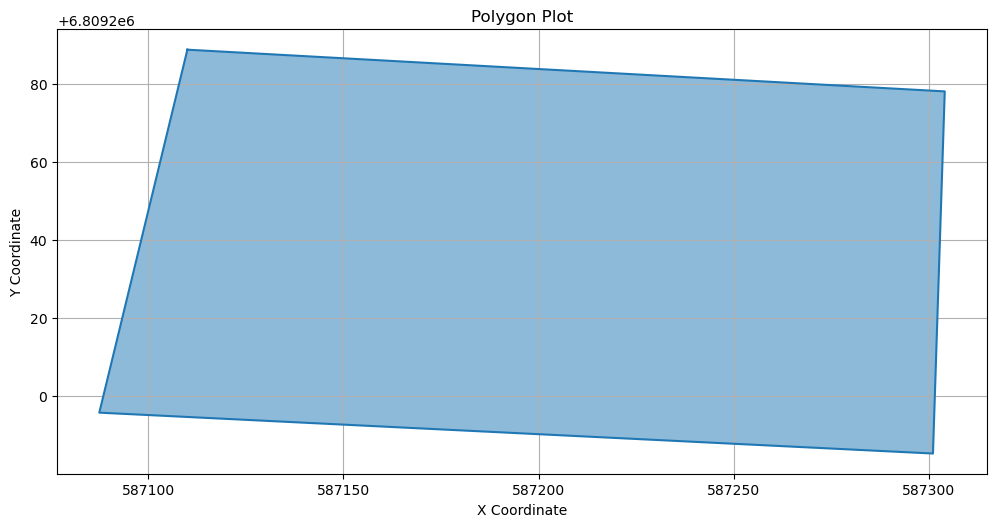

POLYGON ((587169.5666347288 6809490.577018456, 587161.9708062211 6809290.919428162, 587113.8215721428 6809293.588499049, 587114.2851812673 6809316.654371401, 587169.5666347288 6809490.577018456))


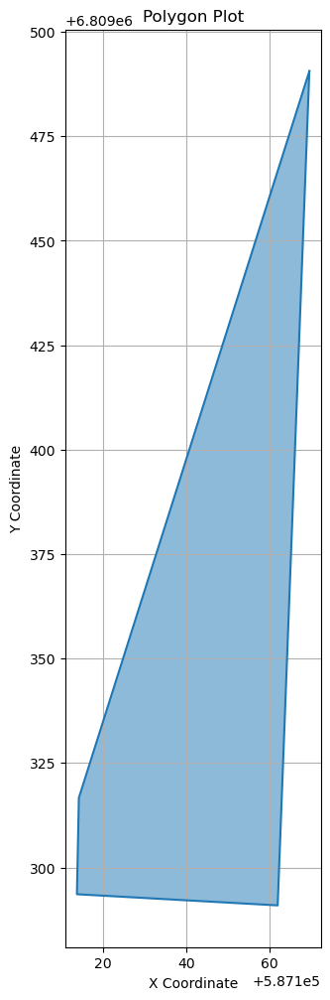

POLYGON ((587170.50902886 6809500.127233114, 587291.1880413109 6809495.263949104, 587280.8917812386 6809284.092030959, 587161.9708062211 6809290.919428162, 587170.50902886 6809500.127233114))


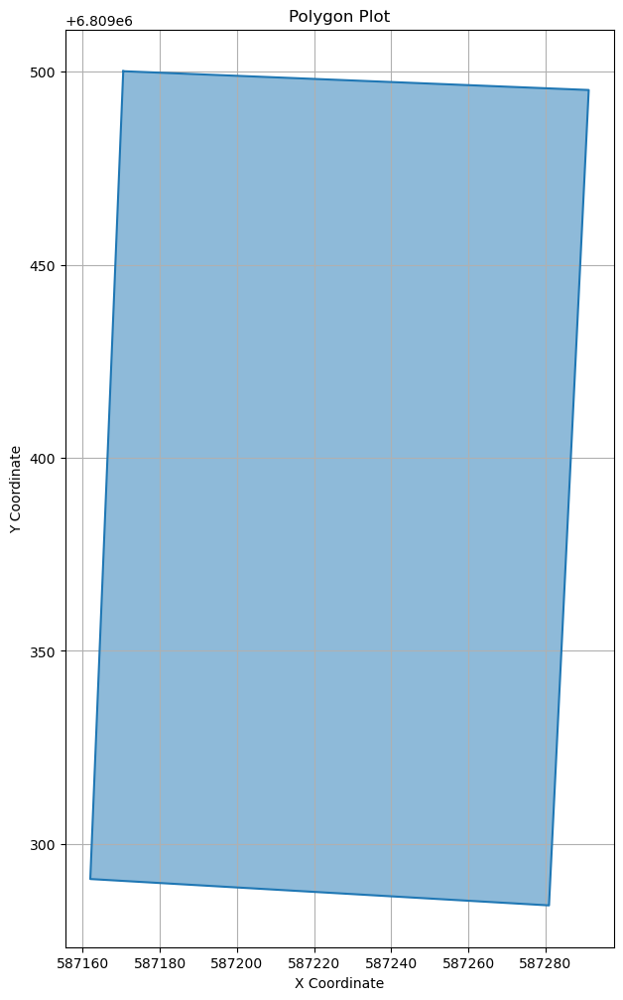

POLYGON ((587196.0896915039 6809567.758660868, 587444.8820589649 6809563.648570579, 587443.2027558766 6809493.095493507, 587327.6015981986 6809498.54883475, 587265.8211845184 6809502.309925072, 587178.5061744106 6809506.262835169, 587196.0896915039 6809567.758660868))


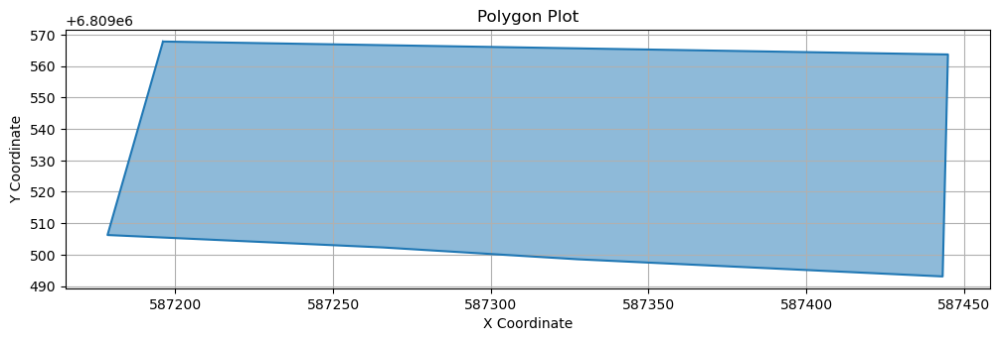

POLYGON ((587206.2331542213 6809604.593291951, 587385.8272933824 6809600.6037548045, 587381.4800271343 6809564.696490009, 587196.6948251066 6809571.0497291945, 587206.2331542213 6809604.593291951))


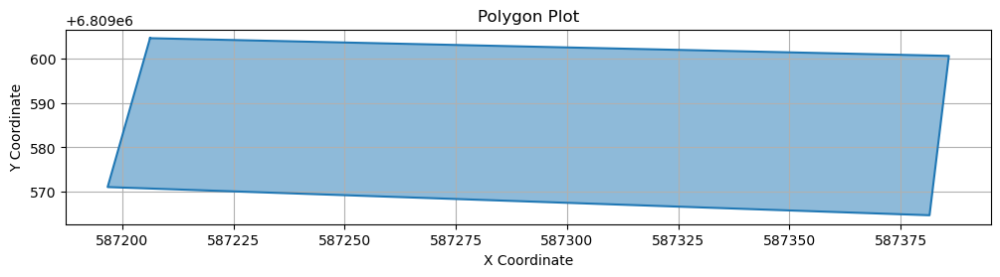

POLYGON ((587220.0595817103 6809657.48694762, 587391.5838587725 6809653.030788643, 587385.8272933824 6809600.6037548045, 587206.2331542213 6809604.593291951, 587220.0595817103 6809657.48694762))


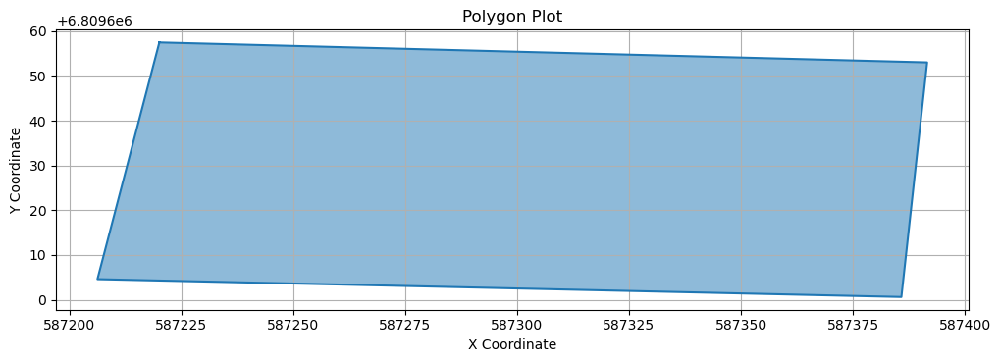

POLYGON ((586656.106431793 6809798.102662943, 586693.2107408043 6809777.260486146, 586700.4964466261 6809773.646710793, 586716.5435303792 6809777.481375573, 586736.3350578033 6809769.819244347, 586785.7092628815 6809759.958189489, 586791.56656439 6809751.609363958, 586769.0082577865 6809575.792309749, 586708.462817476 6809581.782181717, 586621.5279798427 6809597.855895195, 586656.106431793 6809798.102662943))


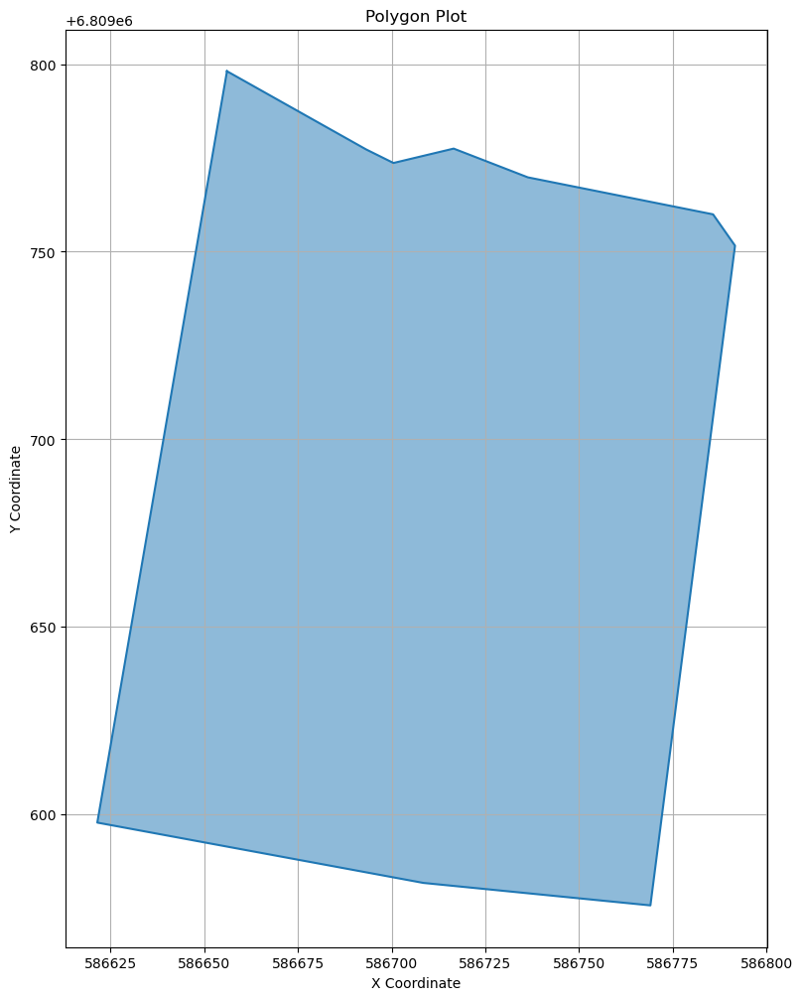

POLYGON ((586791.377520602 6809666.860671685, 586976.6038234555 6809663.098973421, 586942.1110794342 6809521.382530992, 586778.084035177 6809565.718845296, 586791.377520602 6809666.860671685))


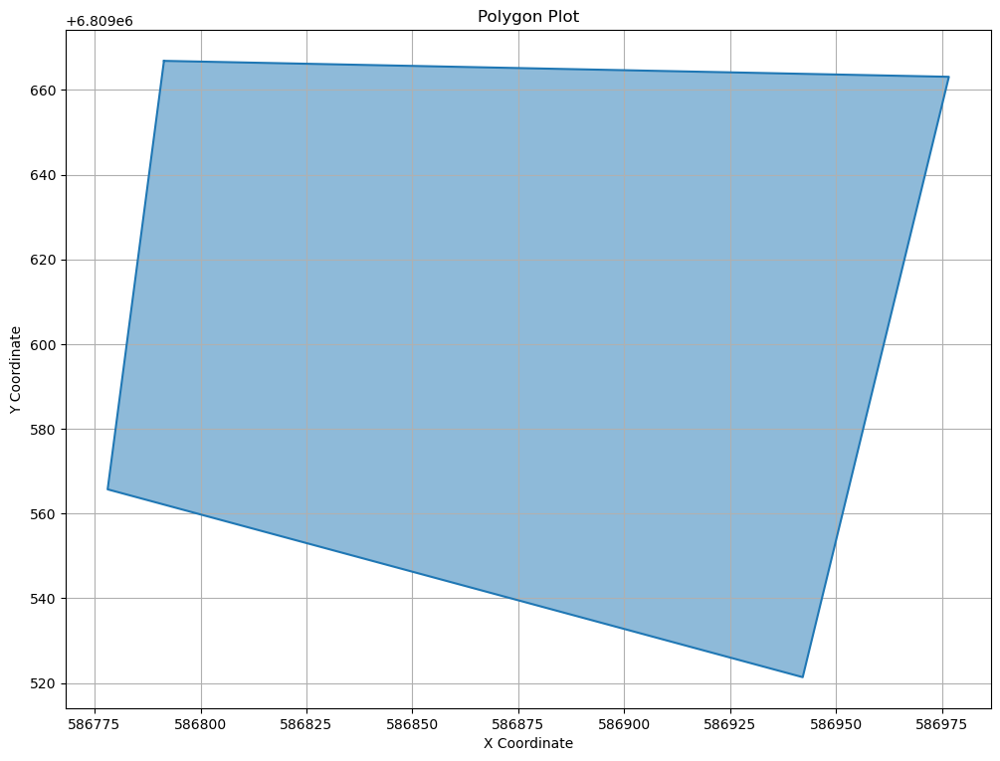

POLYGON ((586574.5589724337 6809357.244600888, 586643.0318871716 6809340.518307703, 586641.7536832956 6809309.285405962, 586637.3476749461 6809278.866841316, 586642.1927811814 6809274.875866852, 586643.877547057 6809267.349257378, 586635.2429915874 6809230.23925162, 586669.2324815388 6809212.188690171, 586634.4204730766 6809166.811333837, 586623.8299472694 6809147.512286479, 586620.9232206517 6809131.319575458, 586541.5724369609 6809183.324244643, 586574.5589724337 6809357.244600888))


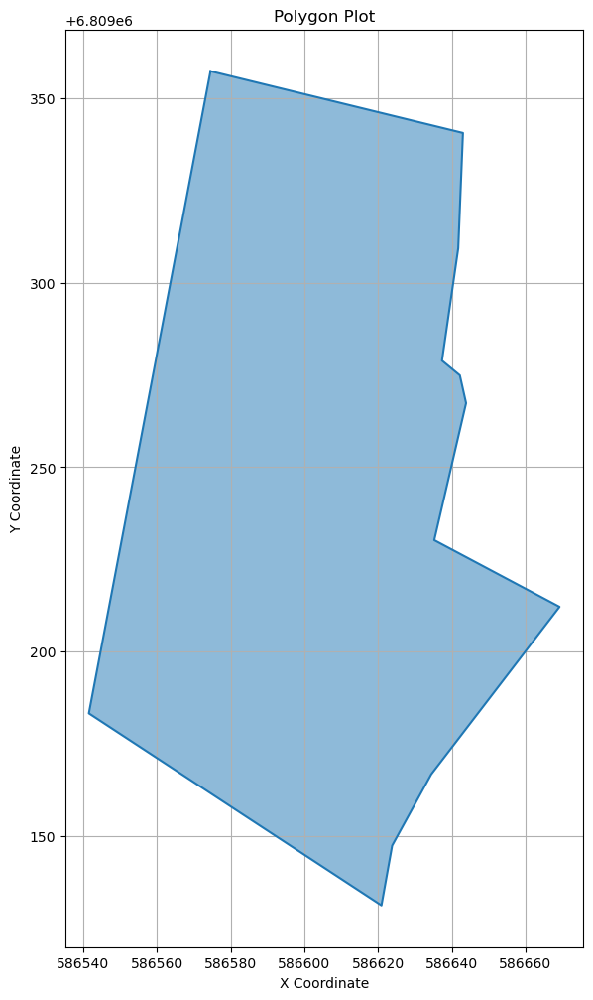

POLYGON ((586651.9577347449 6809323.44616439, 586727.4622814617 6809315.7626776155, 586726.3052172997 6809300.743316098, 586678.4067101399 6809228.334500752, 586647.5213235979 6809242.407130467, 586651.9577347449 6809323.44616439))


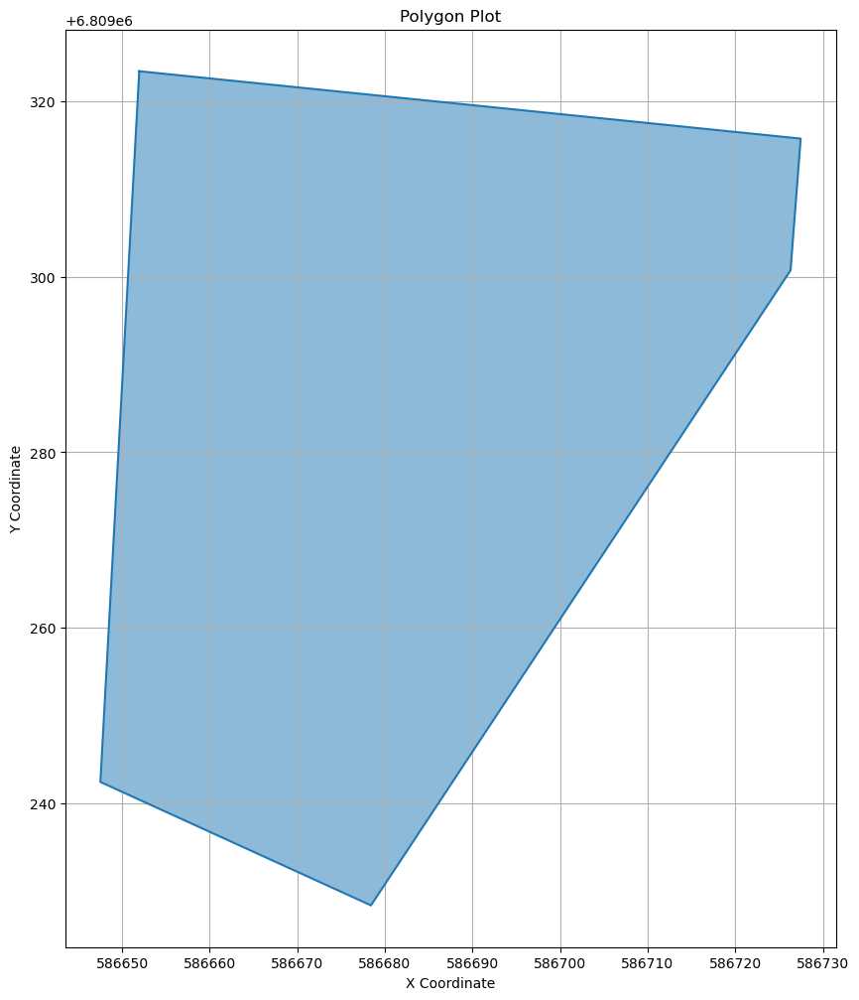

POLYGON ((586894.9541735324 6809223.1530811265, 586910.2626637201 6809221.456354325, 587047.7269183325 6809164.662397917, 587043.6413257587 6809130.682269104, 587062.7845722853 6808944.269791444, 587053.0473728719 6808945.924867447, 586989.6589885561 6809036.569282828, 586968.5622407417 6809055.710464581, 586948.775060408 6809063.768486066, 586924.4377058273 6809068.6968179, 586878.1705820382 6809074.580525493, 586855.1725547457 6809072.380124133, 586821.327448198 6809063.14243342, 586787.384634579 6809040.8547192495, 586776.9539150053 6809042.910229162, 586894.9541735324 6809223.1530811265))


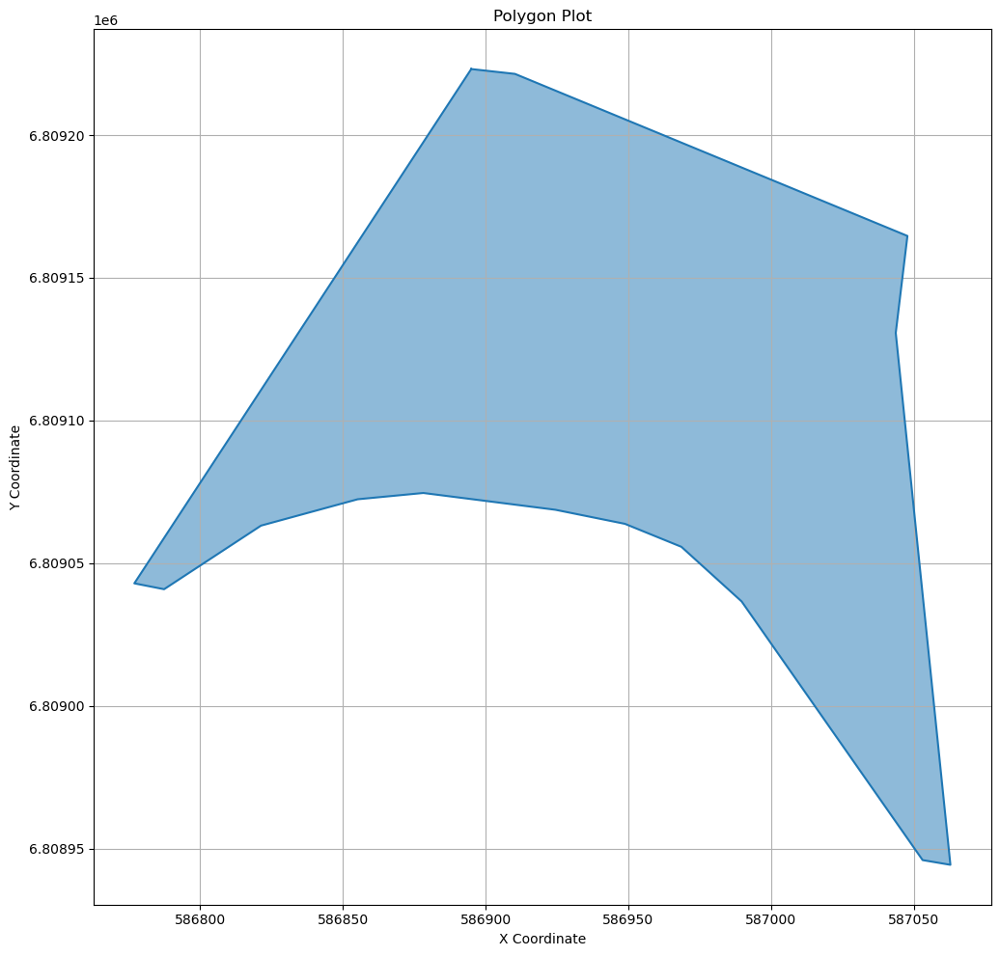

POLYGON ((587097.152218168 6809362.6874098405, 587049.3397311968 6809178.491894616, 586788.2563034691 6809281.164818462, 587097.152218168 6809362.6874098405))


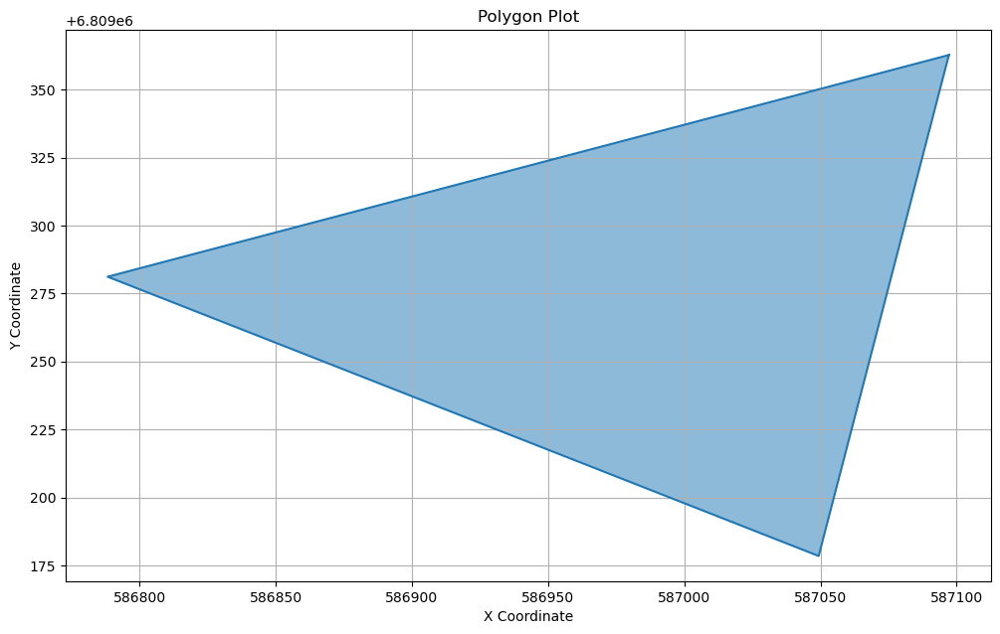

POLYGON ((586283.4156891194 6809445.76155257, 586413.5192673501 6809397.335084938, 586367.9759864025 6809204.683409411, 586360.0837032292 6809204.742242828, 586352.6124416379 6809198.997648433, 586316.0740501734 6809217.725380745, 586259.7689453692 6809262.965103105, 586244.5388329811 6809275.206349725, 586283.4156891194 6809445.76155257))


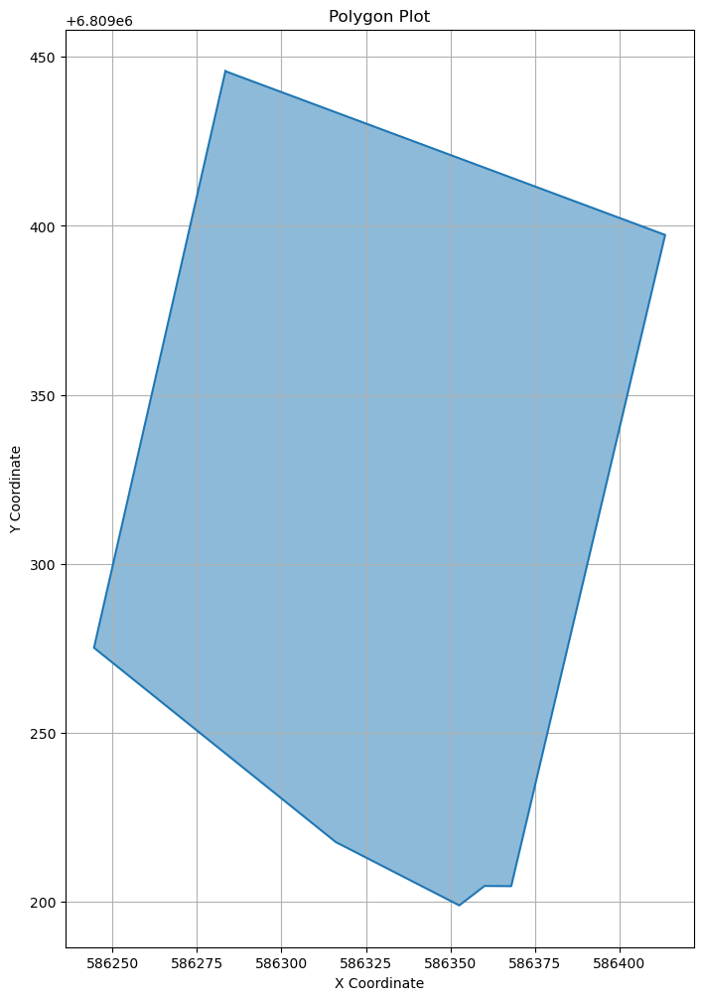

POLYGON ((586118.8419253886 6809479.151132833, 586268.4768771622 6809434.799527215, 586232.5310033041 6809283.7325038025, 586228.5484327772 6809286.828787071, 586198.8287998863 6809309.934470733, 586119.7270264206 6809348.374629188, 586134.140808669 6809413.652449615, 586105.8836391958 6809422.299251623, 586118.8419253886 6809479.151132833))


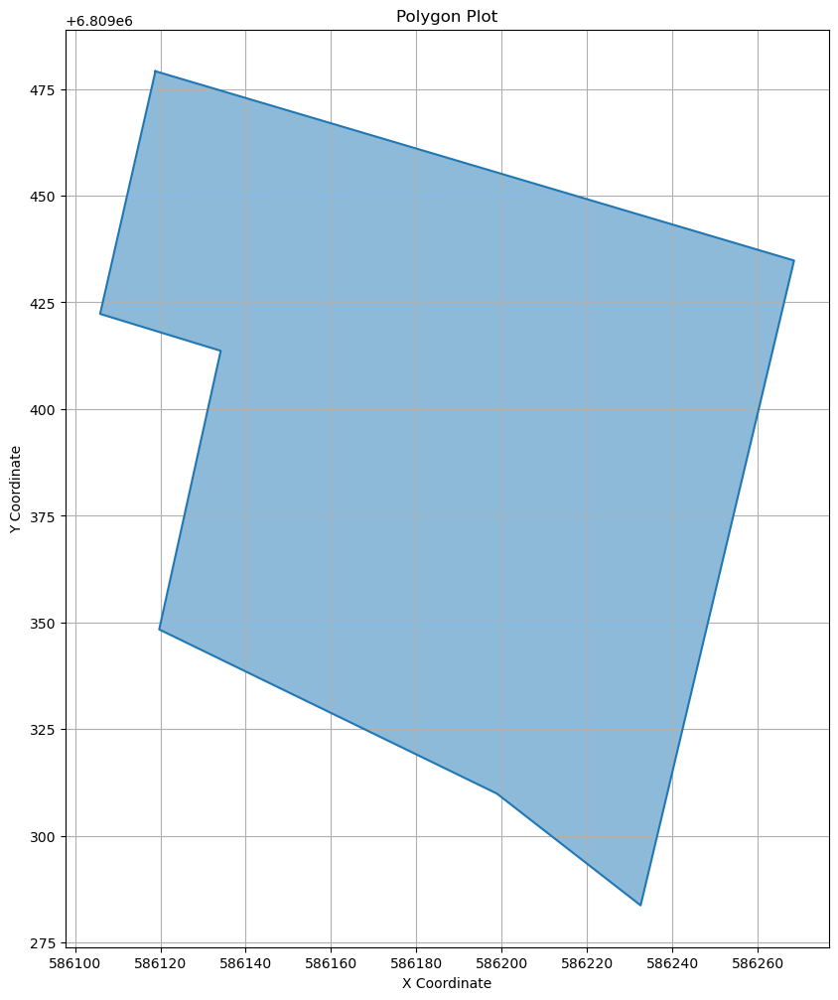

POLYGON ((586017.1723146298 6809480.433657117, 586102.8101409778 6809446.050504477, 586108.7350167927 6809434.809144038, 586070.1572370862 6809362.980026184, 586062.2648510761 6809363.038654052, 585989.3229793946 6809418.946522269, 586017.1723146298 6809480.433657117))


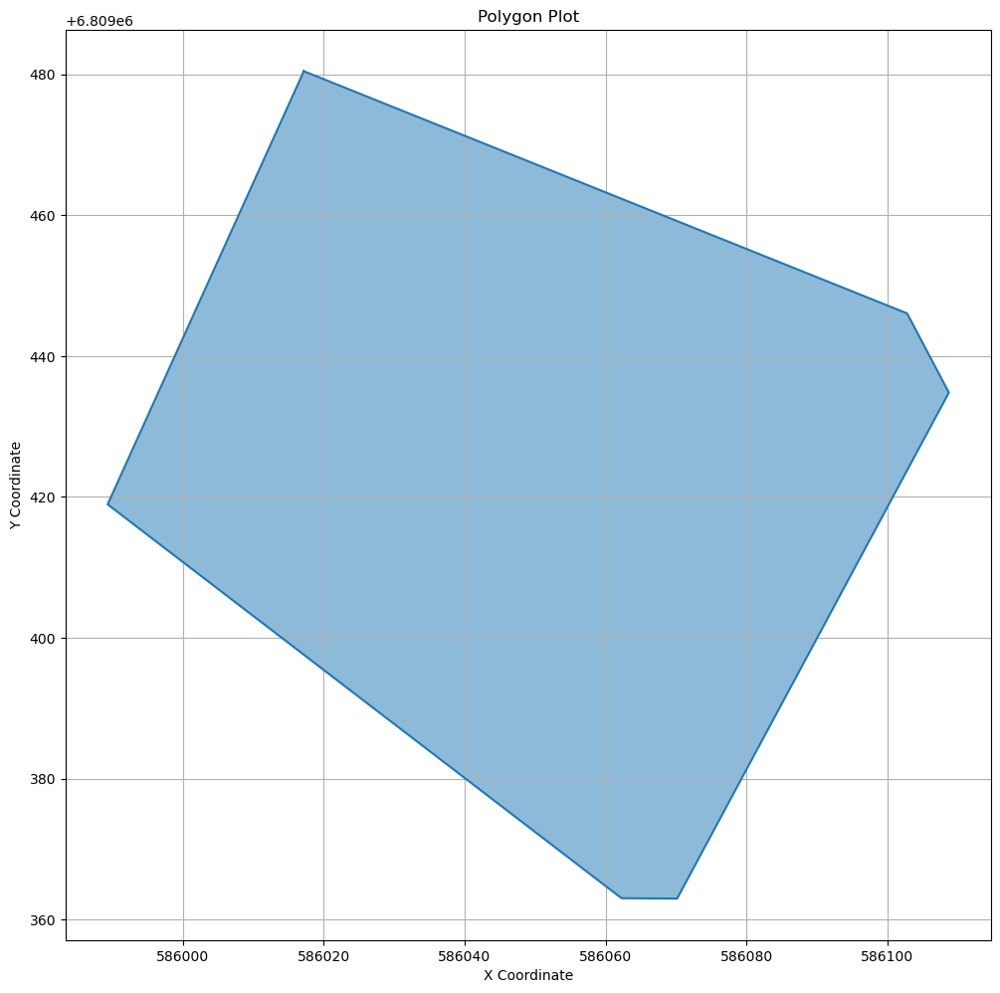

POLYGON ((586110.5892515689 6809680.640286716, 586156.1835379065 6809630.735360824, 586103.7974389845 6809453.95263803, 586094.9921388465 6809456.127262458, 586018.6159901208 6809487.277811935, 586110.5892515689 6809680.640286716))


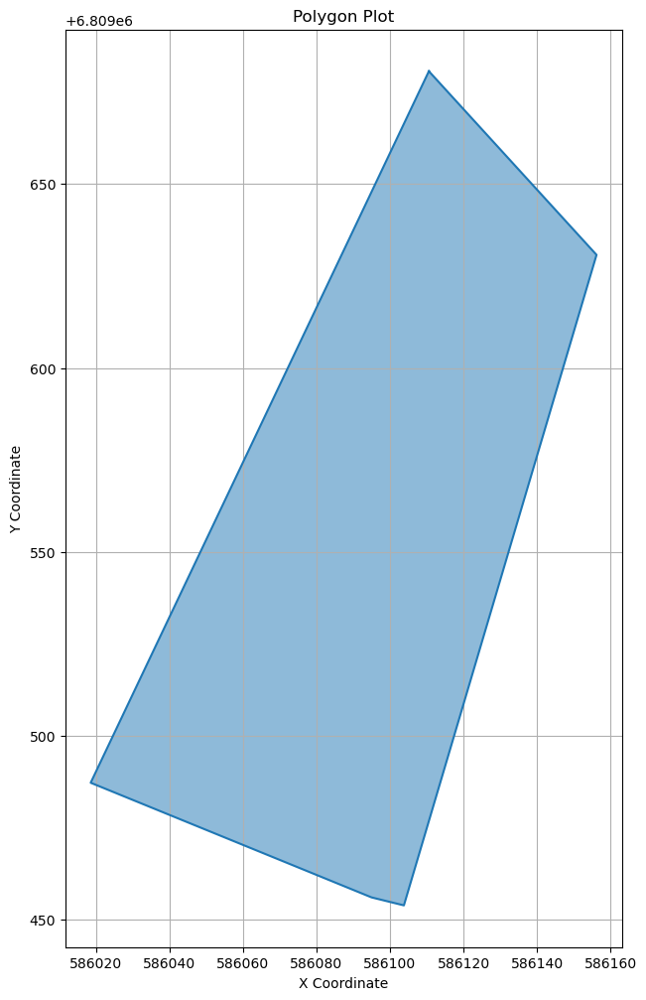

POLYGON ((586202.5879749998 6809752.196070312, 586334.9184995298 6809690.57160422, 586276.0149879992 6809449.507750674, 586129.1340940706 6809489.620591342, 586202.5879749998 6809752.196070312))


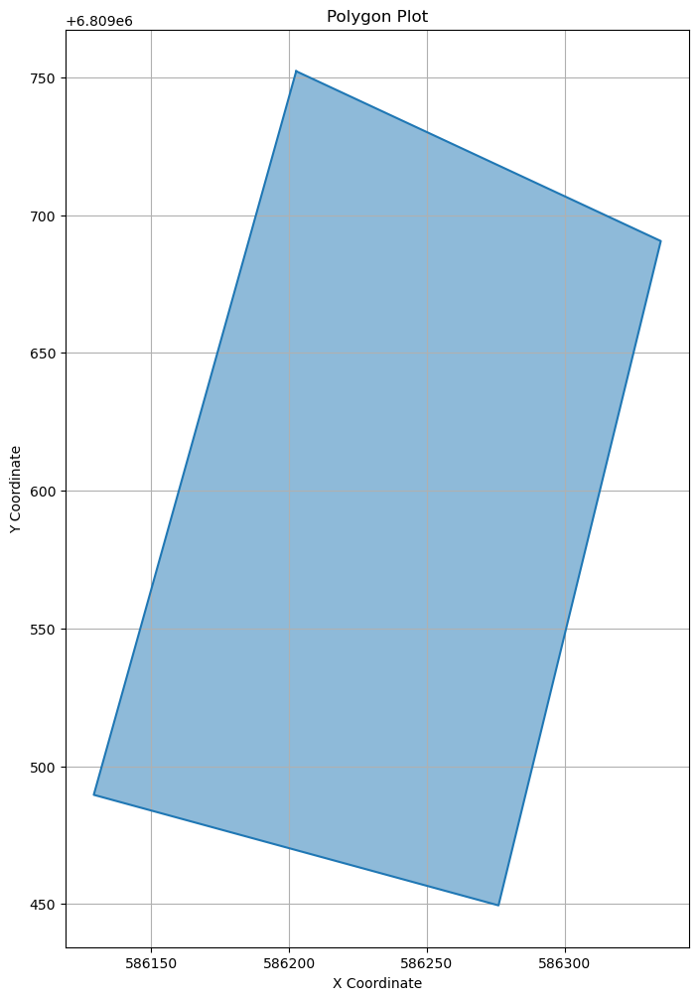

POLYGON ((586568.2258316413 6809363.676558113, 586536.839953857 6809193.766441266, 586522.1949159882 6809197.38395899, 586478.5411438675 6809211.450090026, 586464.8863588995 6809209.797939282, 586455.840608763 6809204.895588091, 586380.3925582874 6809201.073203247, 586400.1871861701 6809301.199775905, 586422.3294762954 6809301.911664404, 586442.4540710679 6809308.193111498, 586452.2851601113 6809314.843682153, 586475.2150662597 6809386.589322118, 586568.2258316413 6809363.676558113))


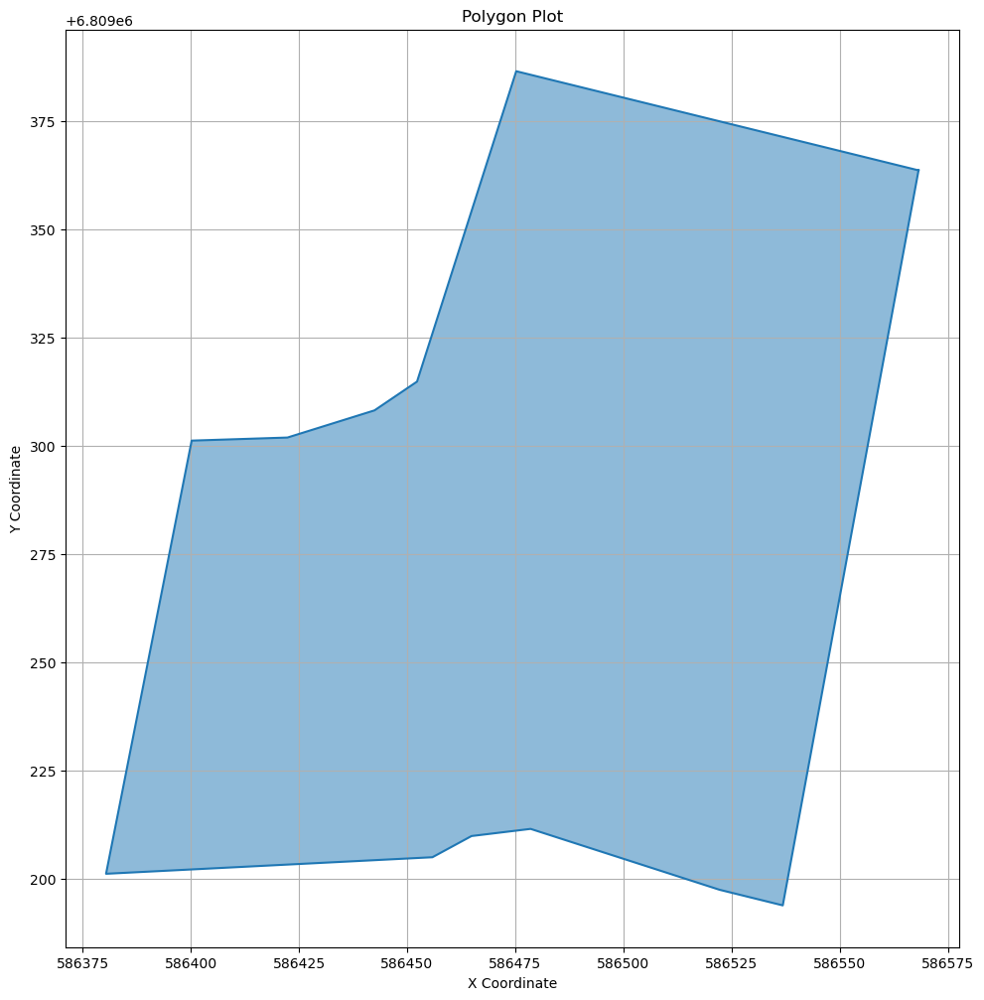

POLYGON ((586427.2881726497 6809414.544253244, 586475.857274466 6809403.657450348, 586446.9178647973 6809319.970526129, 586439.6650638424 6809313.885404297, 586427.0397364737 6809312.2255249005, 586401.5753020127 6809314.754209813, 586427.2881726497 6809414.544253244))


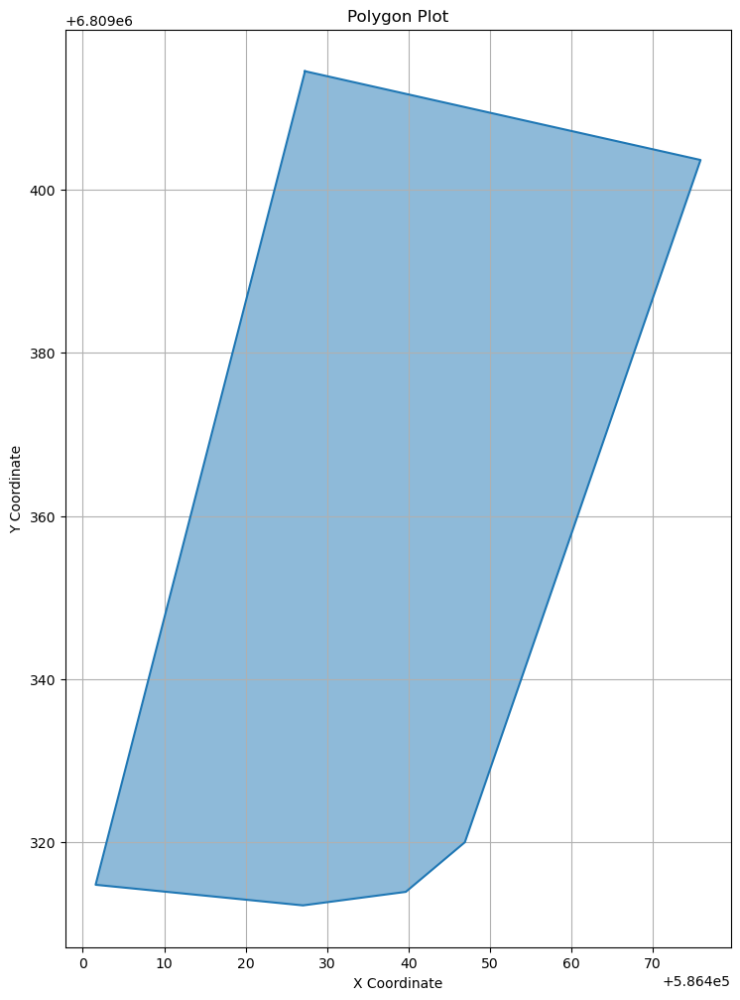

POLYGON ((586514.966534297 6809815.1034693085, 586644.0625699991 6809763.563331848, 586626.1391136127 6809673.0705275275, 586621.7611146406 6809672.81091148, 586504.6811888022 6809782.145335724, 586507.9315187805 6809803.754557875, 586510.8524366776 6809815.718872742, 586514.966534297 6809815.1034693085))


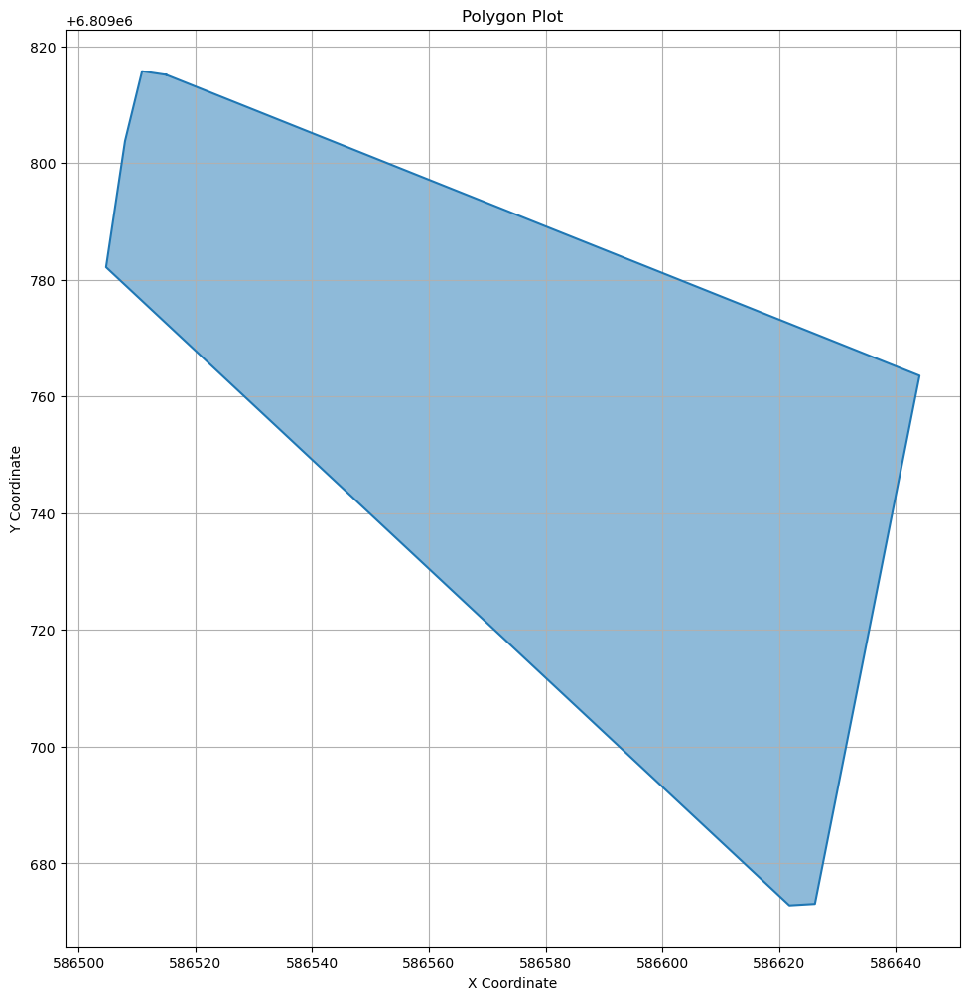

POLYGON ((586534.9882690225 6809910.901406718, 586655.7936978748 6809852.114471067, 586658.7972979364 6809840.690573916, 586645.9129151662 6809770.039545067, 586643.5853596011 6809768.595226007, 586513.9831868217 6809821.30851228, 586514.0486604342 6809830.078355632, 586533.1384036274 6809904.483643599, 586534.9882690225 6809910.901406718))


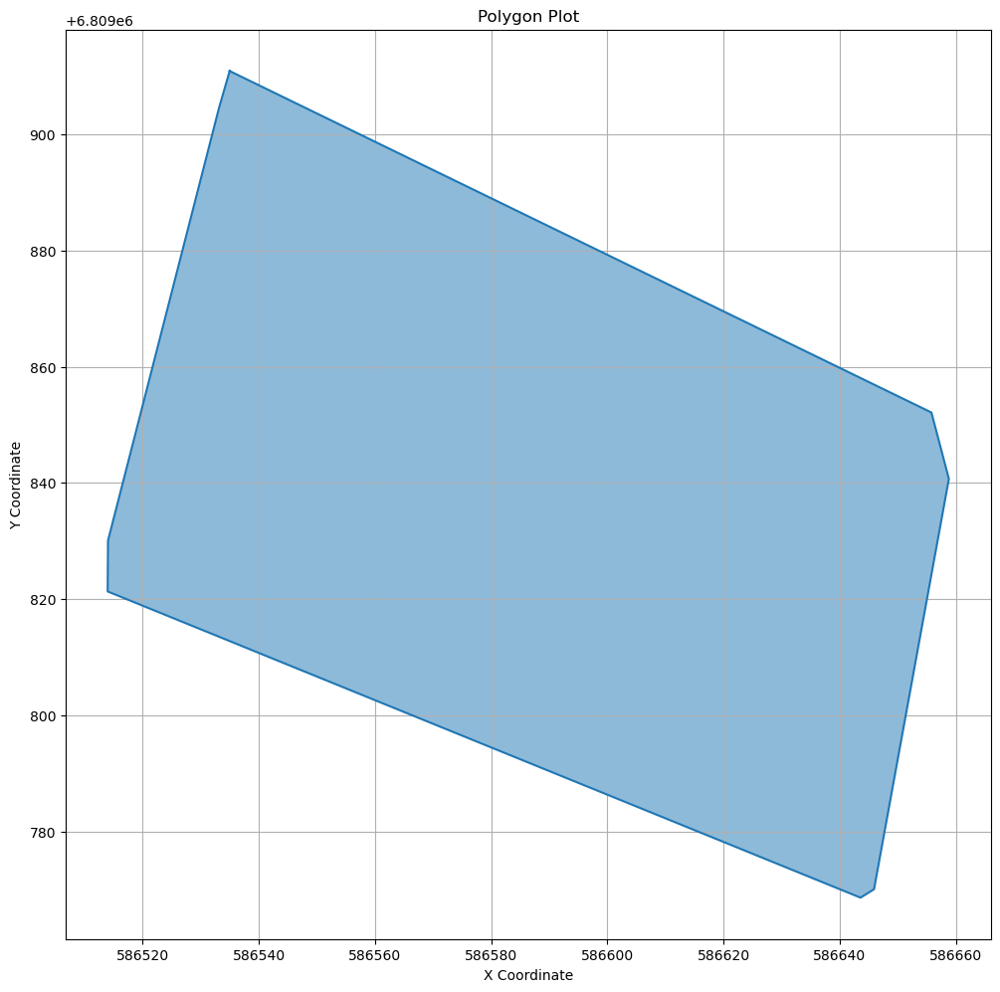

POLYGON ((586357.7435468026 6809754.006875578, 586363.4151156981 6809755.133984166, 586480.8713443568 6809730.57809387, 586468.3175358435 6809669.571794882, 586340.5658632627 6809694.2042966345, 586339.8633611302 6809703.564549153, 586353.1103026065 6809754.041403824, 586357.7435468026 6809754.006875578))


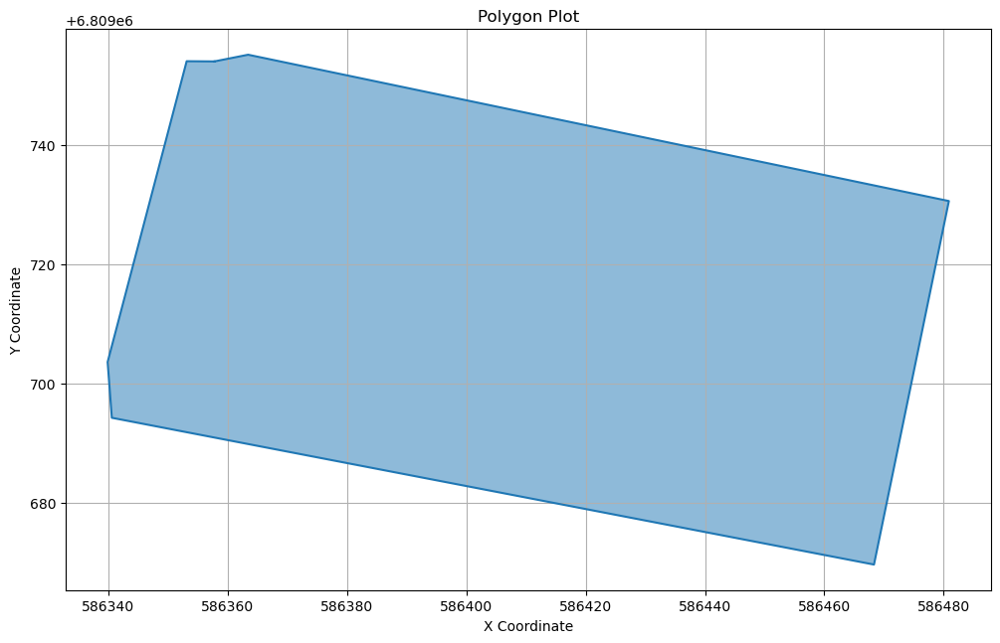

POLYGON ((586341.8049480324 6809687.763488917, 586467.5126127595 6809665.192634941, 586445.1603671694 6809567.424025345, 586312.9403721299 6809579.518788982, 586341.8049480324 6809687.763488917))


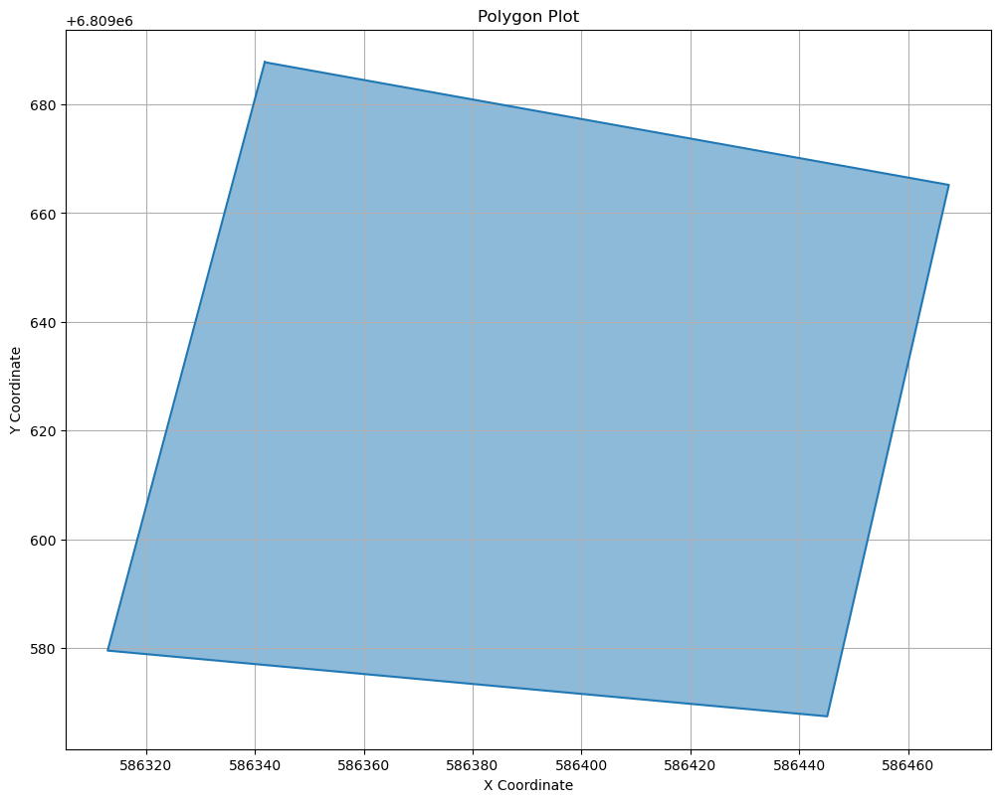

POLYGON ((586313.4442812661 6809578.053313585, 586445.1603671694 6809567.424025345, 586440.1280457344 6809548.459178733, 586309.9761595788 6809561.707864469, 586313.4442812661 6809578.053313585))


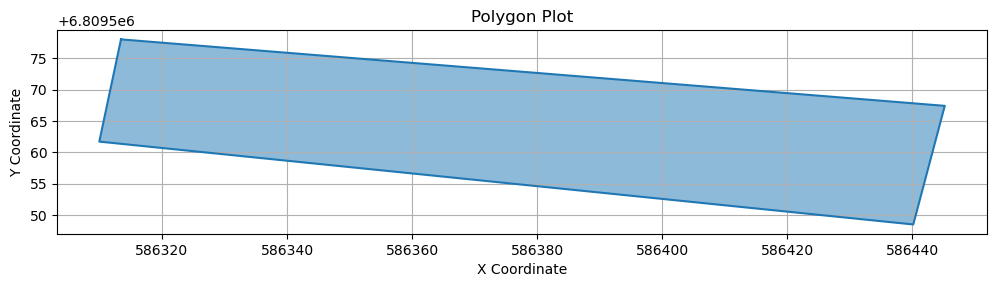

POLYGON ((586552.1200783944 6810008.445712211, 586677.8814563942 6809968.485686931, 586665.7080168856 6809861.798781248, 586563.9409076625 6809912.652772993, 586545.1081997993 6809939.949299254, 586539.2083804375 6809958.185150161, 586552.1200783944 6810008.445712211))


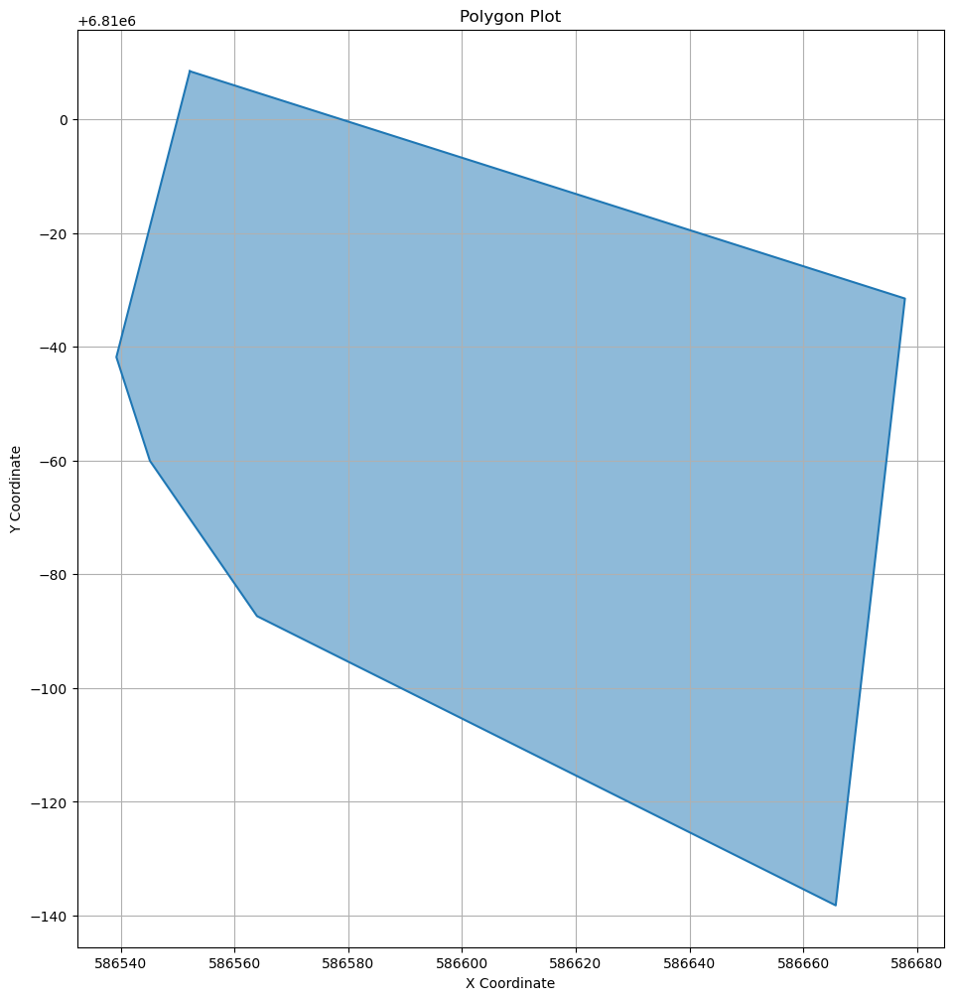

POLYGON ((586246.4134619585 6809917.479265366, 586376.0631891248 6809869.715924257, 586333.8694653163 6809698.328894695, 586206.3360757715 6809757.281168515, 586225.1783928671 6809832.610498714, 586246.4134619585 6809917.479265366))


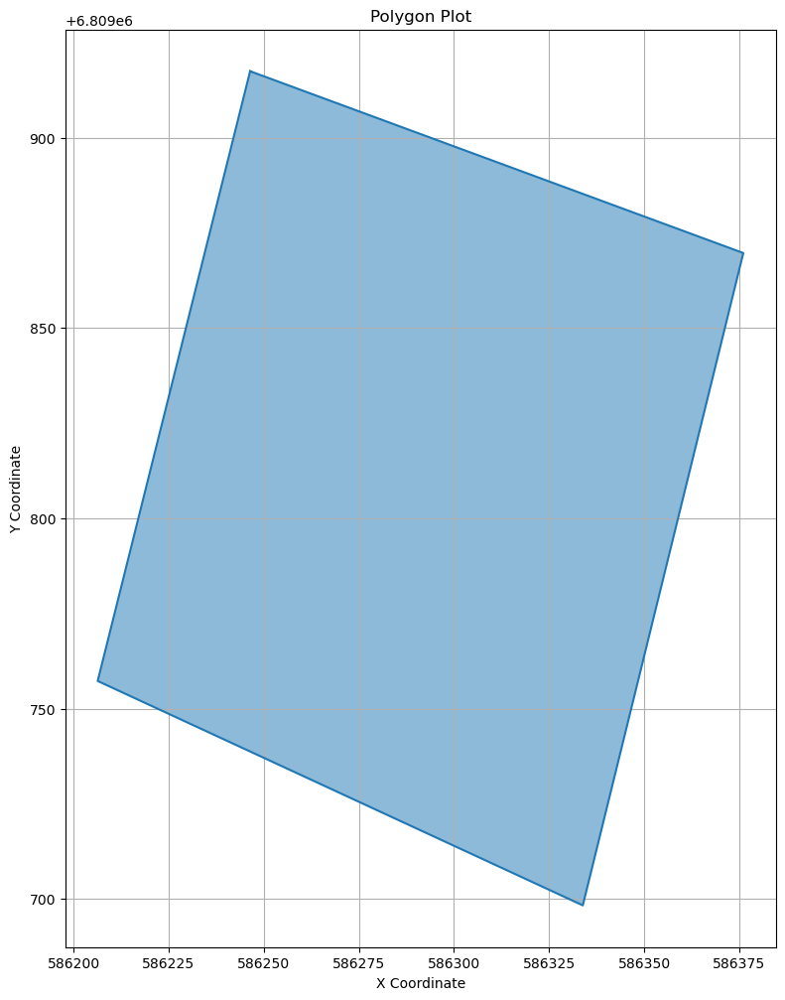

POLYGON ((586291.7033217392 6810076.056520364, 586407.8688868524 6810009.937847806, 586377.3226312263 6809882.95490211, 586252.0253922334 6809930.685857672, 586269.6511127404 6809998.444263985, 586291.7033217392 6810076.056520364))


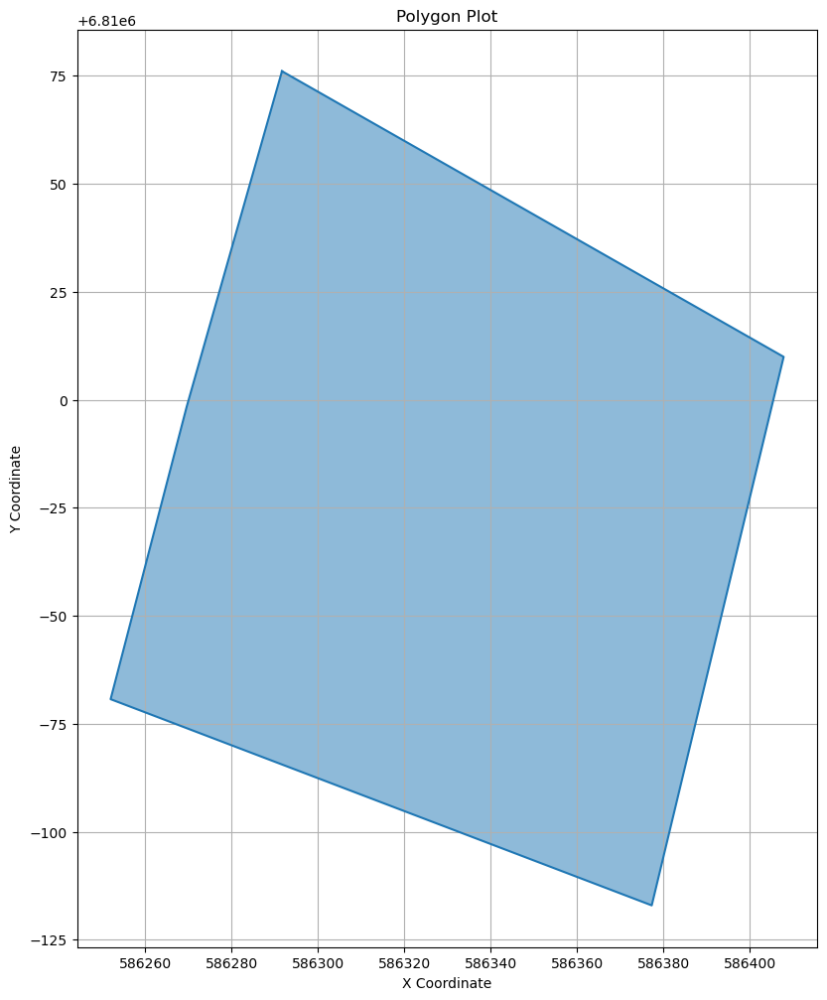

POLYGON ((586228.2514408714 6809894.611078067, 586201.5642586766 6809935.016067732, 586165.821555991 6810006.467050618, 586173.6661483196 6810007.726965448, 586182.6395934036 6810004.694187801, 586232.249313733 6809924.900945239, 586228.2514408714 6809894.611078067))


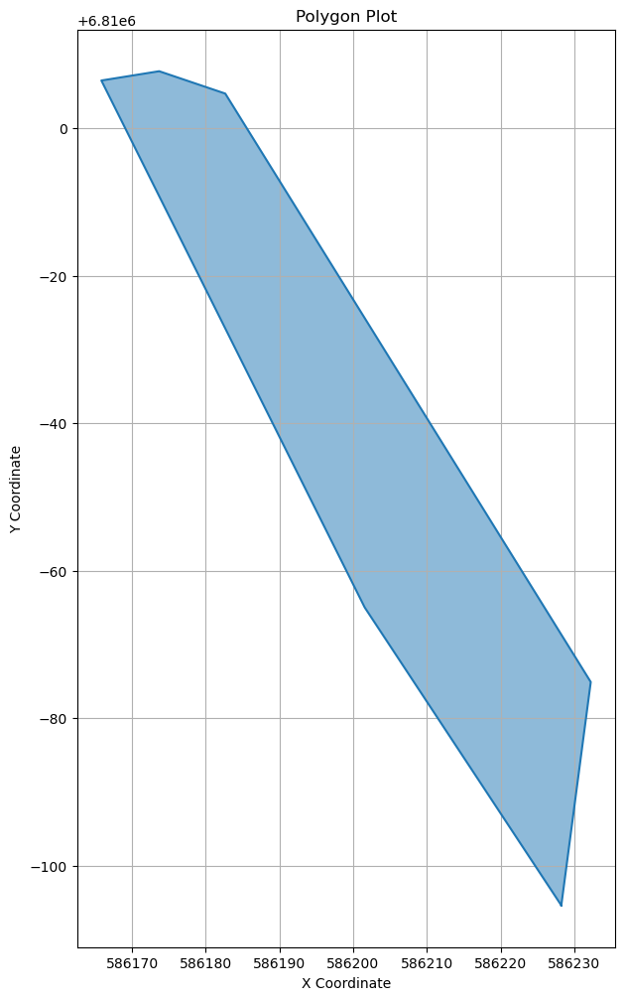

POLYGON ((586133.9397827103 6809894.653309573, 586196.4330580478 6809791.365553869, 586186.0515427822 6809761.123141227, 586181.3401770017 6809751.930467997, 586166.7434063912 6809740.174815807, 586153.9832435471 6809741.25837742, 586044.925125709 6809826.436337947, 586133.9397827103 6809894.653309573))


In [ ]:
# If you want to write the files out to your personal drive,
# set write_out = True, but I recommend trying
# that in your free time because it takes about 2 hours for all 4 training Sentinel timestamps,
# and about 30 minutes for the test timestamp.

write_out = True

if write_out is True:
    # for timestamp in sentinel_timestamps:
    for timestamp in ["2017-03-22"]:
        # timestamp, tiles_dir, img_dir, label_dir = main(timestamp)
        print("timestamp: ", timestamp)

        # return the sentinel timestamp directory path and arrays of images band 2, 3, 4, 8 and band 8 image file
        sentinel_dir, arr_2, arr_3, arr_4, arr_8, src_8 = sentinel_read(timestamp)

        # Calculate 3 vegetation indices and combine the indices into one single 3 channel image
        index_stack = indexnormstack(arr_4, arr_8)

        # The labels variable contains the resulting labeled raster image,
        # where each pixel value represents the label associated with the corresponding
        # region of interest (ROI). This will be same for all images
        labels = label('train/train.shp', src_8)
        # plt.imshow(labels, cmap='viridis')
        # plt.colorbar()
        # plt.show()

        # reset the path of the Sentinel 2 image directory to your personal drive
        # if you want to write the files out
        sentinel_dir = os.path.join("res", timestamp)
        if not os.path.exists(sentinel_dir):
            os.makedirs(sentinel_dir)

        # Save Vegetation Indices of image and labels to geotiff format
        index_stack_file, labels_file = save_images(
                                                sentinel_dir,
                                                index_stack,
                                                labels, src_8)

        # Tile images into 224x224
        tiles_dir, img_dir, label_dir = tile(index_stack, labels, timestamp)
        print("done")
else:
    print("Not writing to file; using data in shared drive too.")

In [127]:
# set the paths to point to the tiles images
tiles_dir = root_dir+'tiled/'

# train
img_dir = root_dir+'tiled/images/'
label_dir = root_dir+'tiled/labels/'

# test
test_img_dir = root_dir+'tiled/images_test/'
test_label_dir = root_dir+'tiled/labels_test/'

In [178]:
# get initial counts of train and test images
%ls $img_dir | wc -l
%ls $test_img_dir | wc -l 

20000
5000


In [176]:
def get_train_test_lists(imdir, lbldir):
    imgs = glob.glob(imdir+"/*.png")
    # print(imgs)
    dset_list = []
    for img in imgs:
        filename_split = os.path.splitext(img)
        filename_zero, fileext = filename_split
        basename = os.path.basename(filename_zero)
        dset_list.append(basename)

    x_filenames = []
    y_filenames = []
    for img_id in dset_list:
        x_filenames.append(os.path.join(imdir, "{}.png".format(img_id)))
        y_filenames.append(os.path.join(lbldir, "{}.png".format(img_id)))

    print("number of images: ", len(dset_list))
    return dset_list, x_filenames, y_filenames

In [163]:
train_list, x_train_filenames, y_train_filenames = get_train_test_lists(
    img_dir,
    label_dir)

number of images:  10000


In [145]:
test_list, x_test_filenames, y_test_filenames = get_train_test_lists(
    test_img_dir,
    test_label_dir)

number of images:  2500


In [165]:
skip = False

if not skip:
    background_list_train = []
    for i in train_list:
        # read in each labeled images
        img = np.array(Image.open(label_dir+"{}.png".format(i)))
        # check if no values in image are greater than zero (background value)
        if img.max() == 0:
            background_list_train.append(i)

    print("number of background training images: ", len(background_list_train))

    background_list_test = []
    for i in test_list:
        img = np.array(Image.open(test_label_dir+"{}.png".format(i)))
        if img.max() == 0:
            background_list_test.append(i)

    print("number of background test images: ", len(background_list_test))

    with open(os.path.join("", 'background_list_train.txt'), 'w') as f:
        for item in background_list_train:
            f.write("%s\n" % item)
    with open(os.path.join("", 'background_list_test.txt'), 'w') as f:
        for item in background_list_test:
            f.write("%s\n" % item)

else:
    background_list_train = [line.strip()
                             for line in open("background_list_train.txt", 'r')]
    print("number of background training images: ", len(background_list_train))

    background_list_test = [line.strip()
                            for line in open("background_list_test.txt", 'r')]

    print("number of background test images: ", len(background_list_test))

number of background training images:  9620
number of background test images:  2405


In [185]:
background_removal = len(background_list_train) * 0.9
print(background_removal)
train_list_clean = [y for y in train_list
                    if y not in
                    background_list_train[0:int(background_removal)]]

x_train_filenames = []
y_train_filenames = []
for img_id in train_list_clean:
    x_train_filenames.append(os.path.join(img_dir, "{}.png".format(img_id)))
    y_train_filenames.append(os.path.join(label_dir, "{}.png".format(img_id)))

print(len(train_list_clean))

8658.0
1342


In [186]:
x_train_filenames, x_val_filenames, y_train_filenames, y_val_filenames = train_test_split(x_train_filenames, y_train_filenames, test_size=0.1, random_state=42)

num_train_examples = len(x_train_filenames)
num_val_examples = len(x_val_filenames)
num_test_examples = len(x_test_filenames)

print("Number of training examples: {}".format(num_train_examples))
# print(x_train_filenames)
print("Number of validation examples: {}".format(num_val_examples))
# print(x_val_filenames)
print("Number of test examples: {}".format(num_test_examples))

Number of training examples: 1207
Number of validation examples: 135
Number of test examples: 2500


[  1 317 243]
images/tiled/images/tile_2017-06-20_869.png
images/tiled/images/tile_2017-08-04_1678.png
images/tiled/images/tile_2017-05-31_1370.png


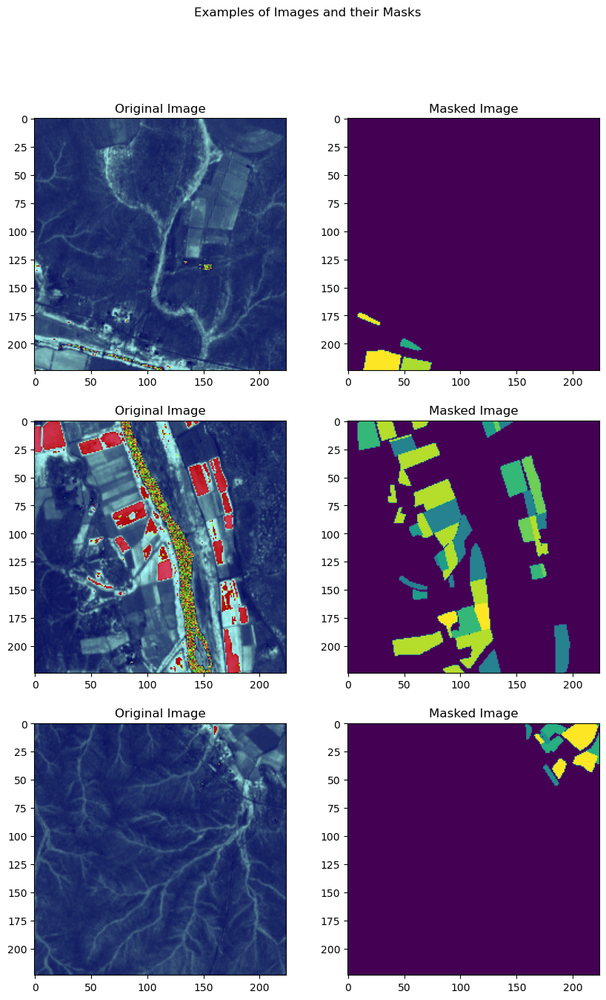

In [194]:
display_num = 3

# select only for tiles with foreground labels present
foreground_list_x = []
foreground_list_y = []

for x, y in zip(x_train_filenames, y_train_filenames):
    img = np.array(Image.open(y))
    if img.max() > 0:
        foreground_list_x.append(x)
        foreground_list_y.append(y)

num_foreground_examples = len(foreground_list_y)
# print(foreground_list_y)
# print(num_foreground_examples)

# randomlize the choice of image and label pairs
r_choices = np.random.choice(num_foreground_examples, display_num)
print(r_choices)

plt.figure(figsize=(10, 15))
for i in range(0, display_num * 2, 2):
    img_num = r_choices[i // 2]
    x_pathname = foreground_list_x[img_num]
    y_pathname = foreground_list_y[img_num]

    plt.subplot(display_num, 2, i + 1)
    plt.imshow(mpimg.imread(x_pathname))
    print(x_pathname)
    plt.title("Original Image")

    example_labels = Image.open(y_pathname)
    label_vals = np.unique(np.array(example_labels))

    plt.subplot(display_num, 2, i + 2)
    plt.imshow(example_labels)
    plt.title("Masked Image")  
  
plt.suptitle("Examples of Images and their Masks")
plt.show()

In [198]:
# set input image shape
img_shape = (224, 224, 3)
# set batch size for model
batch_size = 2

In [199]:
# Function for reading the tiles into TensorFlow tensors 
# See TensorFlow documentation for explanation of tensor: https://www.tensorflow.org/guide/tensor

def _process_pathnames(fname, label_path):
    # We map this function onto each pathname pair
    img_str = tf.io.read_file(fname)
    img = tf.image.decode_png(img_str, channels=3)

    label_img_str = tf.io.read_file(label_path)

    # These are png images so they return as (num_frames, h, w, c)
    label_img = tf.image.decode_png(label_img_str, channels=1)
    # The label image should have any values between 0 and 9, indicating pixel wise
    # cropt type class or background (0). We take the first channel only. 
    label_img = label_img[:, :, 0]
    label_img = tf.expand_dims(label_img, axis=-1)
    return img, label_img

In [200]:
# Function to augment the data with horizontal flip
def flip_img_h(horizontal_flip, tr_img, label_img):
  if horizontal_flip:
    flip_prob = tf.random.uniform([], 0.0, 1.0)
    tr_img, label_img = tf.cond(tf.less(flip_prob, 0.5),
                                lambda: (tf.image.flip_left_right(tr_img), tf.image.flip_left_right(label_img)),
                                lambda: (tr_img, label_img))
  return tr_img, label_img

In [201]:
# Function to augment the data with vertical flip
def flip_img_v(vertical_flip, tr_img, label_img):
  if vertical_flip:
    flip_prob = tf.random.uniform([], 0.0, 1.0)
    tr_img, label_img = tf.cond(tf.less(flip_prob, 0.5),
                                lambda: (tf.image.flip_up_down(tr_img), tf.image.flip_up_down(label_img)),
                                lambda: (tr_img, label_img))
  return tr_img, label_img

In [202]:
# Function to augment the images and labels
def _augment(img,
             label_img,
             resize=None,  # Resize the image to some size e.g. [256, 256]
             scale=1,  # Scale image e.g. 1 / 255.
             horizontal_flip=False,
             vertical_flip=False):
  if resize is not None:
    # Resize both images
    label_img = tf.image.resize(label_img, resize)
    img = tf.image.resize(img, resize)
  
  img, label_img = flip_img_h(horizontal_flip, img, label_img)
  img, label_img = flip_img_v(vertical_flip, img, label_img)
  img = tf.cast(img, tf.float32) * scale  #tf.to_float(img) * scale 
  #label_img = tf.cast(label_img, tf.float32) * scale
  #print("tensor: ", tf.unique(tf.keras.backend.print_tensor(label_img)))
  return img, label_img

In [216]:
# Main function to tie all of the above four dataset processing functions together 
def get_baseline_dataset(filenames,
                         labels,
                         preproc_fn=functools.partial(_augment),
                         threads=5,
                         batch_size=batch_size,
                         shuffle=True):
    num_x = len(filenames)
    print(num_x)
    # Create a dataset from the filenames and labels
    dataset = tf.data.Dataset.from_tensor_slices((filenames, labels))
    # for data in dataset:
    #     print(data)
    # Map our preprocessing function to every element in our dataset, taking
    # advantage of multithreading
    dataset = dataset.map(_process_pathnames, num_parallel_calls=threads)
    if preproc_fn.keywords is not None and 'resize' not in preproc_fn.keywords:
        assert batch_size == 1, "Batching images must be of the same size"

    dataset = dataset.map(preproc_fn, num_parallel_calls=threads)

    if shuffle:
        dataset = dataset.shuffle(num_x)
  
  
    # It's necessary to repeat our data for all epochs 
    dataset = dataset.repeat().batch(batch_size)
    return dataset

In [211]:
# dataset configuration for training
tr_cfg = {
    'resize': [img_shape[0], img_shape[1]],
    'scale': 1 / 255.,
    'horizontal_flip': True,
    'vertical_flip': True,
}
tr_preprocessing_fn = functools.partial(_augment, **tr_cfg)

In [218]:
# dataset configuration for validation
val_cfg = {
    'resize': [img_shape[0], img_shape[1]],
    'scale': 1 / 255.,
}
val_preprocessing_fn = functools.partial(_augment, **val_cfg)

In [219]:
# dataset configuration for testing
test_cfg = {
    'resize': [img_shape[0], img_shape[1]],
    'scale': 1 / 255.,
}
test_preprocessing_fn = functools.partial(_augment, **test_cfg)

In [222]:
# create the TensorFlow datasets
train_ds = get_baseline_dataset(x_train_filenames,
                                y_train_filenames,
                                preproc_fn=tr_preprocessing_fn,
                                batch_size=batch_size)
val_ds = get_baseline_dataset(x_val_filenames,
                              y_val_filenames,
                              preproc_fn=val_preprocessing_fn,
                              batch_size=batch_size)
test_ds = get_baseline_dataset(x_test_filenames,
                               y_test_filenames,
                               preproc_fn=test_preprocessing_fn,
                               batch_size=batch_size)

1207
135
2500


In [228]:
# Now we will display some samples from the datasets
display_num = 1
r_choices = np.random.choice(num_foreground_examples, 1)
for i in range(0, display_num * 2, 2):
    img_num = r_choices[i // 2]

temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1],
                               foreground_list_y[img_num:img_num+1],
                               preproc_fn=tr_preprocessing_fn,
                               batch_size=1,
                               shuffle=False)

# Let's examine some of these augmented images

iterator = iter(temp_ds)
next_element = iterator.get_next()
# print(next_element)

batch_of_imgs, label = next_element

# Running next element in our graph will produce a batch of images

sample_image, sample_mask = batch_of_imgs[0], label[0, :, :, :]

1


In [230]:
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

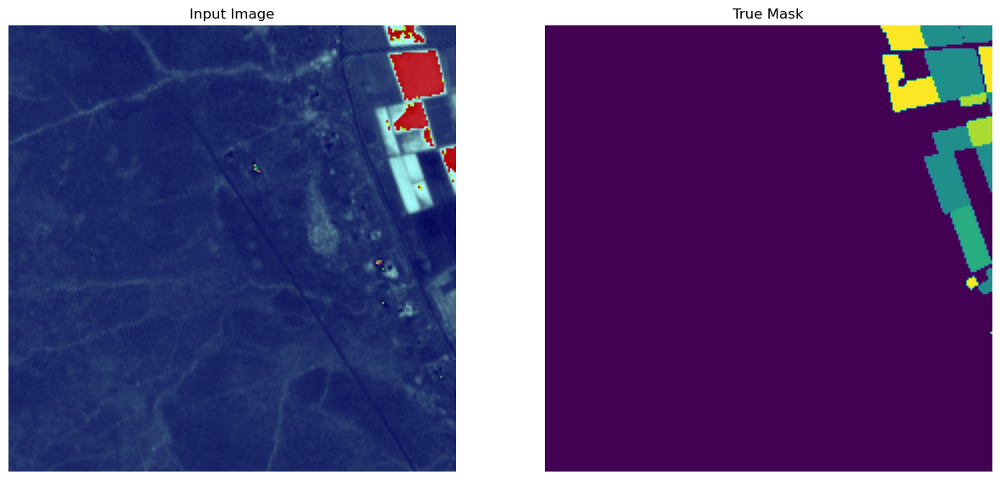

In [231]:
# display sample train image
display([sample_image, sample_mask])

1


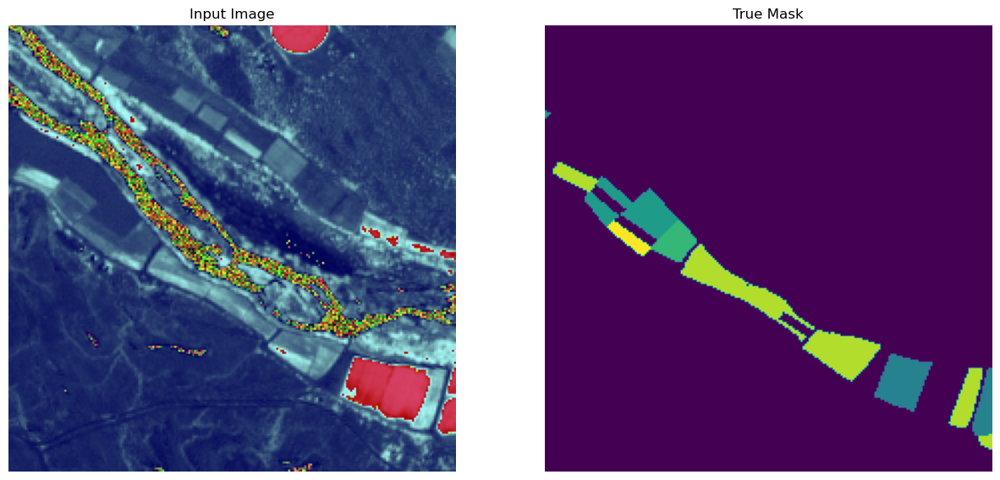

In [232]:
# reset the forground list to capture the validation images
foreground_list_x = []
foreground_list_y = []
for x,y in zip(x_val_filenames, y_val_filenames):
    img = np.array(Image.open(y))
    if img.max() > 0:
        foreground_list_x.append(x)
        foreground_list_y.append(y)

num_foreground_examples = len(foreground_list_y)

display_num = 1
r_choices = np.random.choice(num_foreground_examples, 1)
for i in range(0, display_num * 2, 2):
  img_num = r_choices[i // 2]

temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1], 
                               foreground_list_y[img_num:img_num+1],
                               preproc_fn=val_preprocessing_fn,
                               batch_size=1,
                               shuffle=False)

# Let's examine some of these augmented images

iterator = iter(temp_ds)
next_element = iterator.get_next()

batch_of_imgs, label = next_element

# Running next element in our graph will produce a batch of images

sample_image, sample_mask = batch_of_imgs[0], label[0, :, :, :]

# display sample validation image
display([sample_image, sample_mask])

1


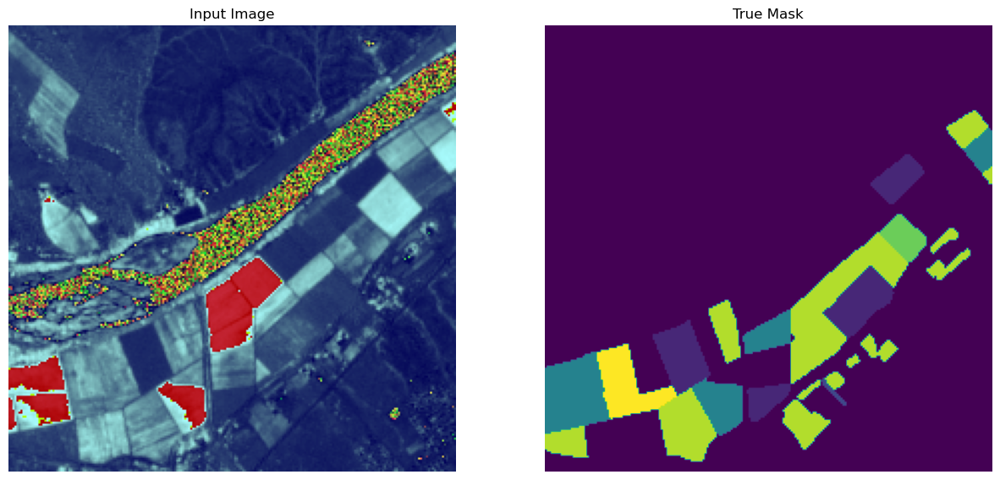

In [233]:
# reset the forground list to capture the test images
foreground_list_x = []
foreground_list_y = []
for x,y in zip(x_test_filenames, y_test_filenames):
    img = np.array(Image.open(y))
    if img.max() > 0:
        foreground_list_x.append(x)
        foreground_list_y.append(y)

num_foreground_examples = len(foreground_list_y)

display_num = 1
r_choices = np.random.choice(num_foreground_examples, 1)
for i in range(0, display_num * 2, 2):
    img_num = r_choices[i // 2]

temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1], 
                               foreground_list_y[img_num:img_num+1],
                               preproc_fn=test_preprocessing_fn,
                               batch_size=1,
                               shuffle=False)

# Let's examine some of these augmented images

iterator = iter(temp_ds)
next_element = iterator.get_next()

batch_of_imgs, label = next_element

# Running next element in our graph will produce a batch of images

sample_image, sample_mask = batch_of_imgs[0], label[0, :, :, :]

# display sample test image
display([sample_image, sample_mask])

In [35]:
# set number of model output channels to the number of classes (including background)
OUTPUT_CHANNELS = 10

In [36]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[224, 224, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
layers = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)

down_stack.trainable = False

In [37]:
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

In [38]:
def unet_model(output_channels):
    inputs = tf.keras.layers.Input(shape=[224, 224, 3])
  x = inputs

  # Downsampling through the model
  skips = down_stack(x)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2,
      padding='same')  #64x64 -> 224x224

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [39]:
model = unet_model(OUTPUT_CHANNELS)

In [40]:
train_df = pd.read_csv('Farmpin_training.csv')
inv_freq = np.array(1/(train_df.crop_id.value_counts()/len(train_df)))
inv_freq = [0., *inv_freq]
class_weights = {0 : inv_freq[0], 1: inv_freq[1], 2: inv_freq[2], 3: inv_freq[3], 
                4: inv_freq[4], 5: inv_freq[5], 6: inv_freq[6],
                7: inv_freq[7], 8: inv_freq[8], 9: inv_freq[9]}
class_weights

{0: 0.0,
 1: 2.647932131495228,
 2: 4.6585820895522385,
 3: 8.823321554770319,
 4: 9.352059925093632,
 5: 16.98639455782313,
 6: 17.58450704225352,
 7: 26.28421052631579,
 8: 32.42857142857143,
 9: 356.7142857142857}

In [41]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss=SparseCategoricalFocalLoss(gamma=2, from_logits=True),
              metrics=['accuracy'])

In [42]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

1/1 [==============================] - 1s 985ms/step


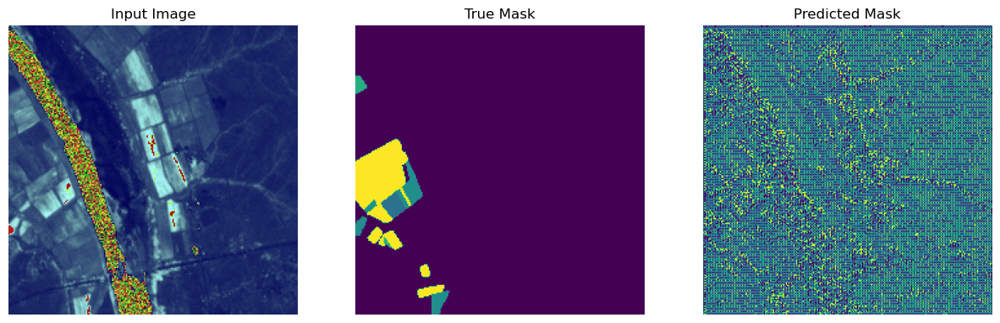

In [43]:
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    mp = create_mask(model.predict(sample_image[tf.newaxis, ...]))
    mpe = tf.keras.backend.eval(mp)
    display([sample_image, sample_mask, mpe])
show_predictions()

In [48]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    clear_output(wait=True)
    show_predictions()
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

1/1 [==============================] - 0s 86ms/step


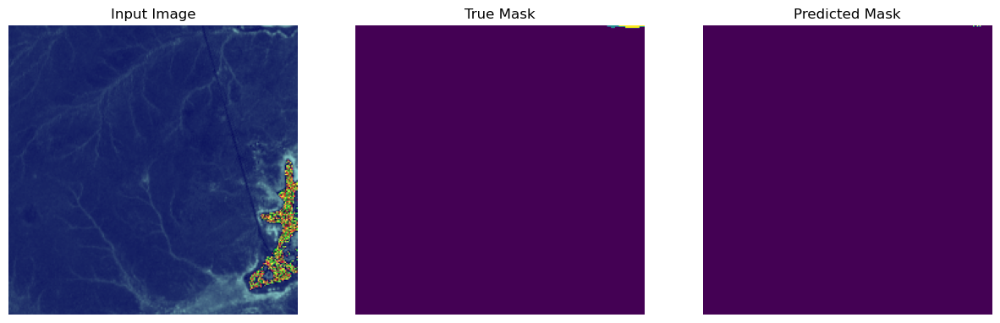


Sample Prediction after epoch 20

604/604 [==============================] - 122s 202ms/step - loss: 0.0014 - accuracy: 0.9981 - val_loss: 0.0714 - val_accuracy: 0.9842
Epoch 21/100
184/604 [========>.....................] - ETA: 1:18 - loss: 0.0013 - accuracy: 0.9982

KeyboardInterrupt: 

In [286]:
EPOCHS = 100

model_history = model.fit(train_ds,
                          steps_per_epoch=int(np.ceil(num_train_examples / float(batch_size))),
                          epochs=EPOCHS,
                          validation_data=val_ds,
                          validation_steps=int(np.ceil(num_val_examples / float(batch_size))),
                          callbacks=[DisplayCallback()]) 

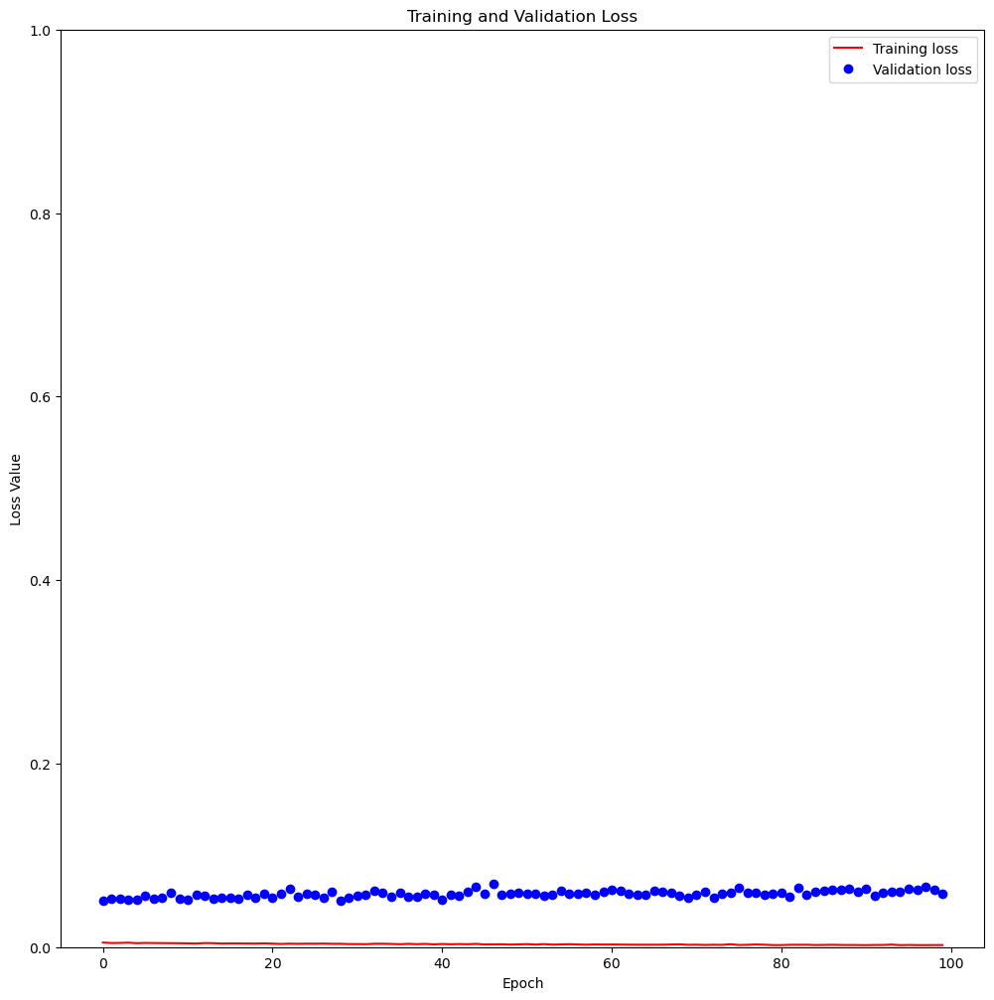

In [50]:
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

In [51]:
save_model_path = os.path.join("",'model_out/')
if (not os.path.isdir(save_model_path)):
  os.mkdir(save_model_path)
model.save(save_model_path)

INFO:tensorflow:Assets written to: model_out/assets


INFO:tensorflow:Assets written to: model_out/assets


In [52]:
# Optional, you can load the model from the saved version
load_from_checkpoint = True
if load_from_checkpoint == True:
  model = tf.keras.models.load_model(save_model_path)
else:
  print("inferencing from in memory model")

In [53]:
def get_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      return pred_mask
  else:
    pred_mask = create_mask(model.predict(sample_image[tf.newaxis, ...]))
    pred_mask = tf.keras.backend.eval(pred_mask)
    return pred_mask

1/1 [==============================] - 0s 66ms/step


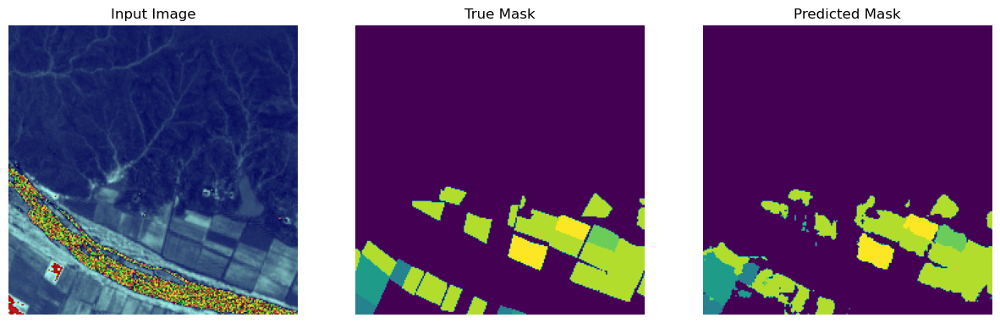

In [54]:
display_num = 1
r_choices = np.random.choice(num_foreground_examples, 1)
for i in range(0, display_num * 2, 2):
  img_num = r_choices[i // 2]

temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1], 
                               foreground_list_y[img_num:img_num+1],
                               preproc_fn=test_preprocessing_fn,
                               batch_size=1,
                               shuffle=False)

# Let's examine some of these augmented images

iterator = iter(temp_ds)
next_element = iterator.get_next()

batch_of_imgs, label = next_element

# Running next element in our graph will produce a batch of images

sample_image, sample_mask = batch_of_imgs[0], label[0,:,:,:]

# run and plot predicitions
pred_mask = get_predictions()

show_predictions()

['images/tiled/labels_test/tile_2017-07-10_769.png']
[0 8]
1/1 [==============================] - 0s 81ms/step


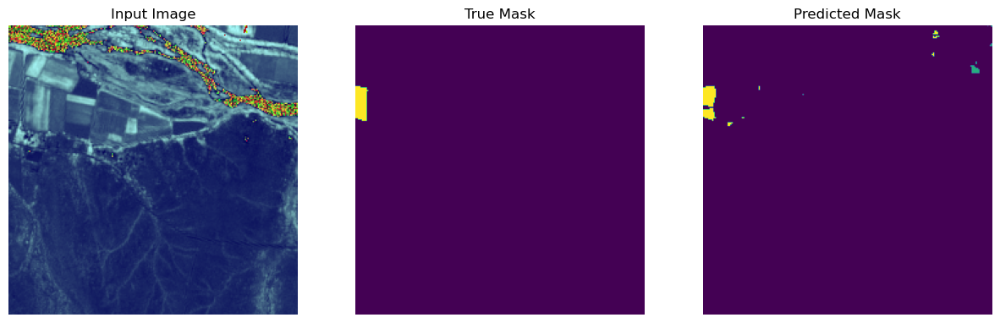

1/1 [==============================] - 0s 84ms/step
['images/tiled/labels_test/tile_2017-07-10_819.png']
[0 6 8]
1/1 [==============================] - 0s 84ms/step


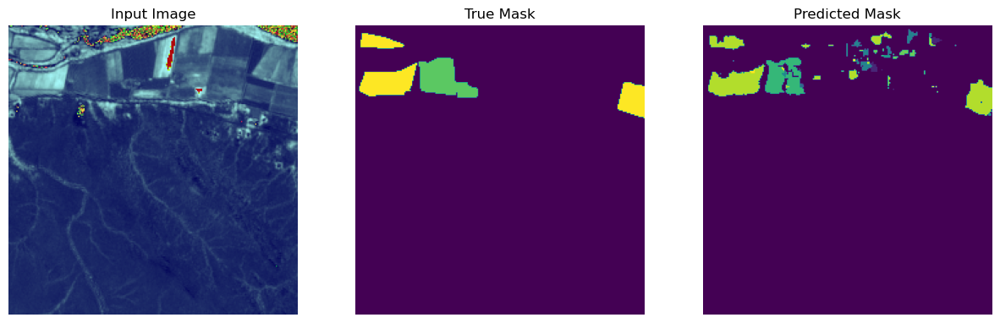

1/1 [==============================] - 0s 110ms/step
['images/tiled/labels_test/tile_2017-07-10_869.png']
[0 5 7 8]
1/1 [==============================] - 0s 86ms/step


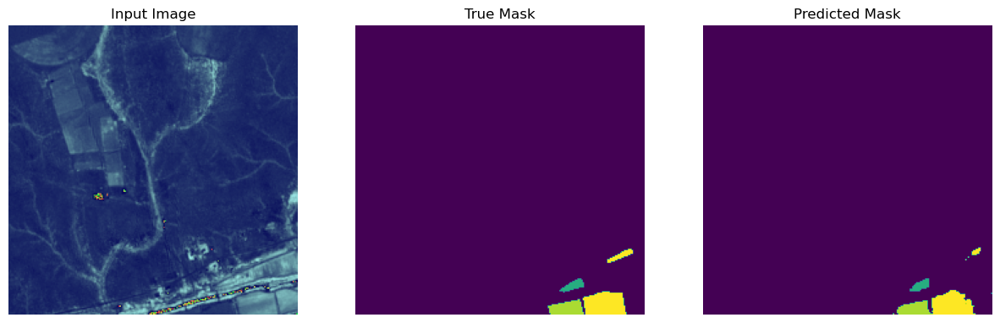

1/1 [==============================] - 0s 75ms/step
['images/tiled/labels_test/tile_2017-07-10_870.png']
[0 5 7 8]
1/1 [==============================] - 0s 83ms/step


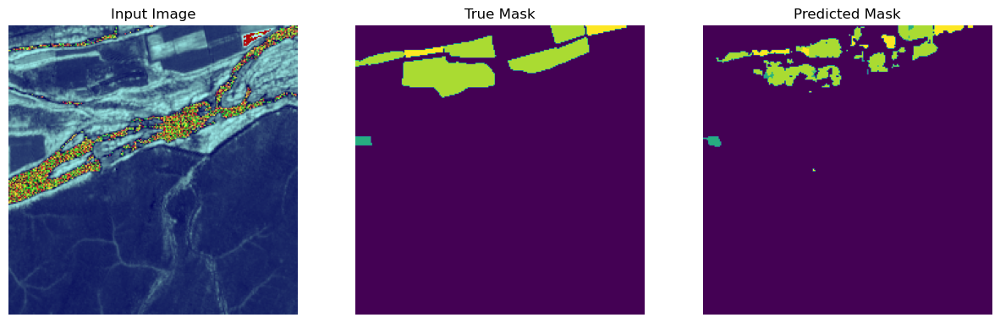

1/1 [==============================] - 0s 89ms/step
['images/tiled/labels_test/tile_2017-07-10_919.png']
[0 4 5 7 8]
1/1 [==============================] - 0s 83ms/step


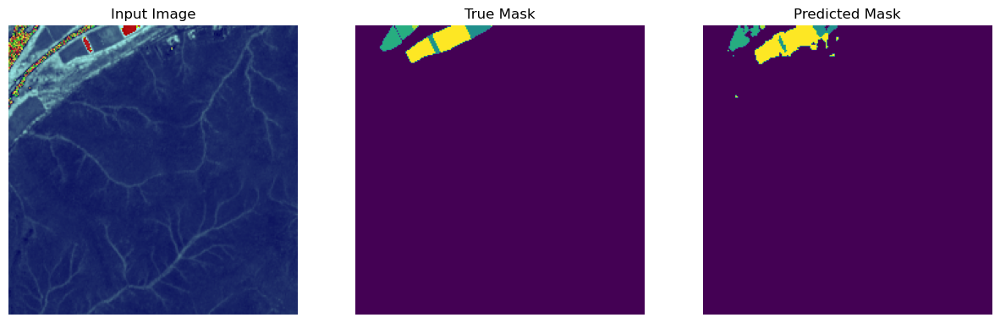

1/1 [==============================] - 0s 74ms/step
['images/tiled/labels_test/tile_2017-07-10_920.png']
[0 4 5 6 7 8]
1/1 [==============================] - 0s 114ms/step


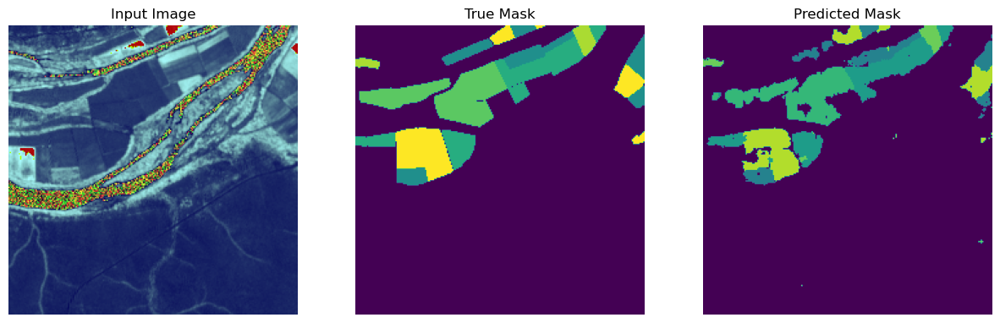

1/1 [==============================] - 0s 98ms/step
['images/tiled/labels_test/tile_2017-07-10_968.png']
[0 4 8]
1/1 [==============================] - 0s 80ms/step


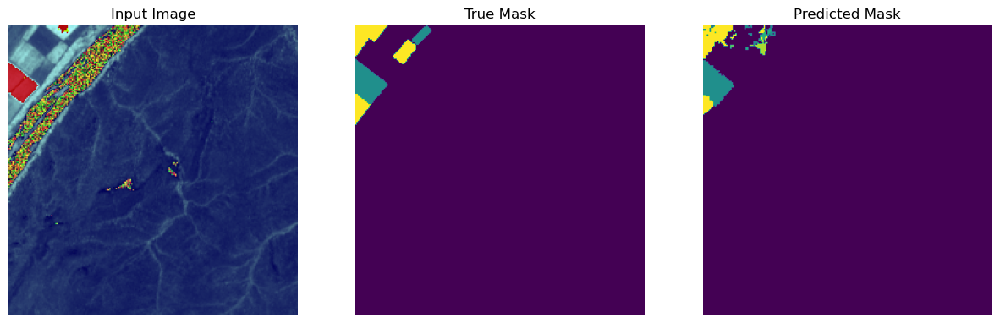

1/1 [==============================] - 0s 85ms/step
['images/tiled/labels_test/tile_2017-07-10_969.png']
[0 1 3 4 5 6 7 8]
1/1 [==============================] - 0s 88ms/step


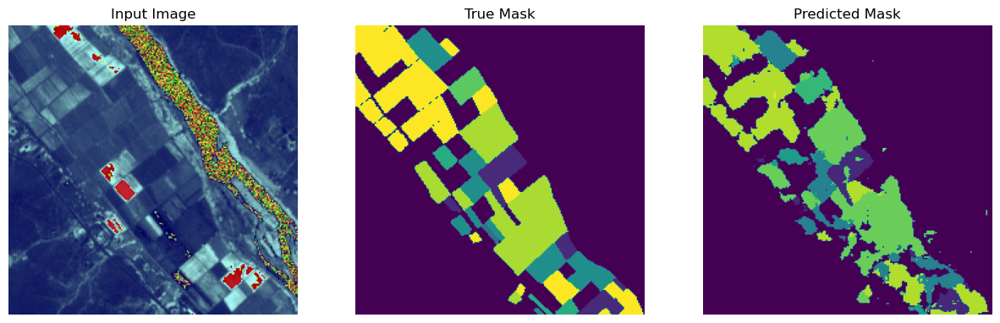

1/1 [==============================] - 0s 99ms/step
['images/tiled/labels_test/tile_2017-07-10_970.png']
[0 1 3 4 5 7 8]
1/1 [==============================] - 0s 74ms/step


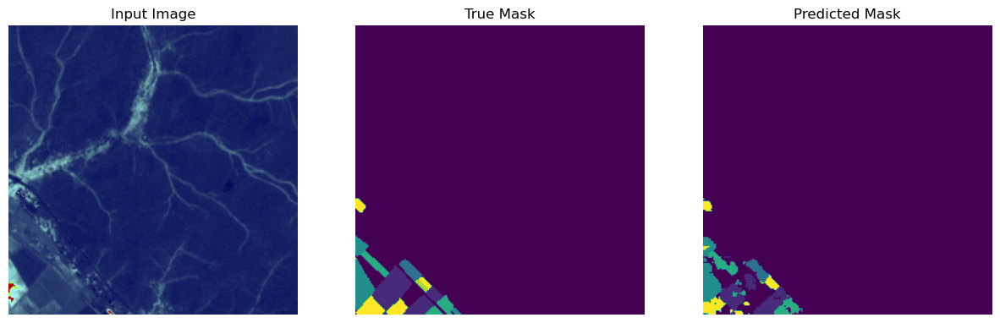

1/1 [==============================] - 0s 71ms/step
['images/tiled/labels_test/tile_2017-07-10_1017.png']
[0 4]
1/1 [==============================] - 0s 67ms/step


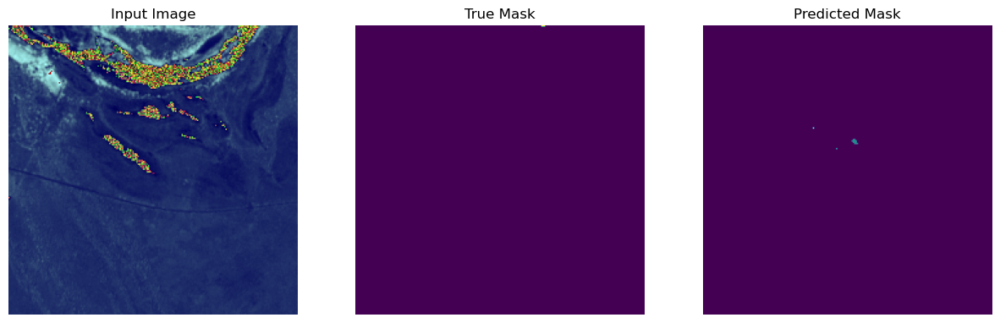

1/1 [==============================] - 0s 60ms/step
['images/tiled/labels_test/tile_2017-07-10_1018.png']
[0 1 4 5 6 7 8 9]
1/1 [==============================] - 0s 89ms/step


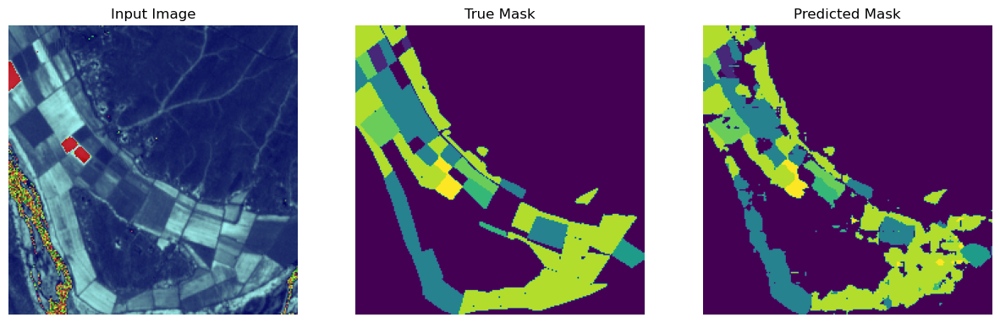

1/1 [==============================] - 0s 79ms/step
['images/tiled/labels_test/tile_2017-07-10_1019.png']
[0 4 8]
1/1 [==============================] - 0s 104ms/step


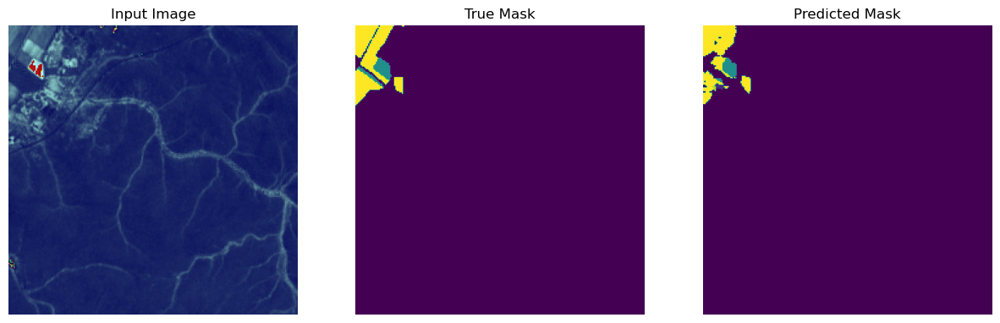

1/1 [==============================] - 0s 92ms/step
['images/tiled/labels_test/tile_2017-07-10_1068.png']
[0 4 5 6 8 9]
1/1 [==============================] - 0s 80ms/step


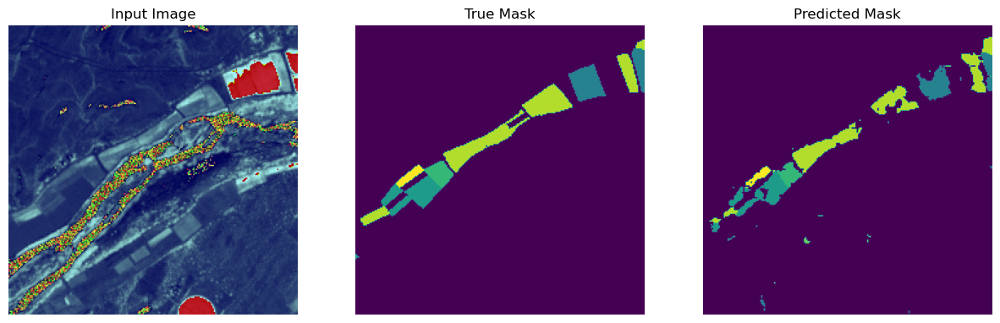

1/1 [==============================] - 0s 122ms/step
['images/tiled/labels_test/tile_2017-07-10_1118.png']
[0 1 2 4 7 8 9]
1/1 [==============================] - 0s 137ms/step


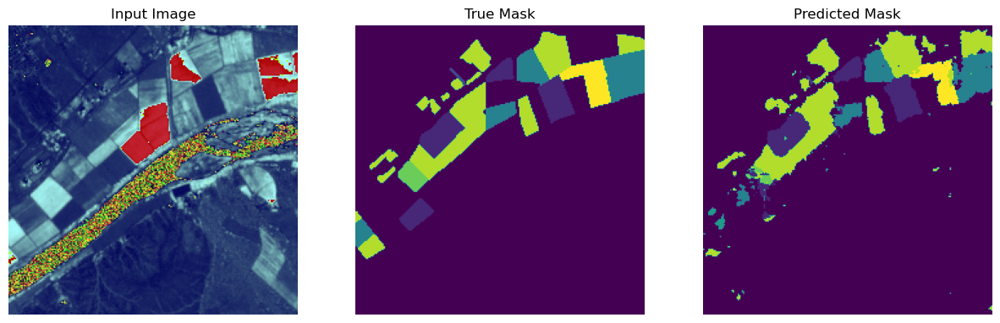

1/1 [==============================] - 0s 107ms/step
['images/tiled/labels_test/tile_2017-07-10_1167.png']
[0 1 4 8 9]
1/1 [==============================] - 0s 85ms/step


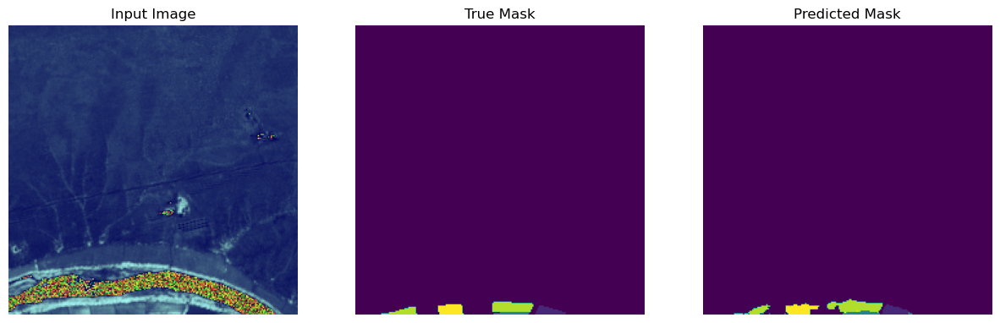

1/1 [==============================] - 0s 82ms/step
['images/tiled/labels_test/tile_2017-07-10_1168.png']
[0 1 4 5 6 7 8 9]
1/1 [==============================] - 0s 85ms/step


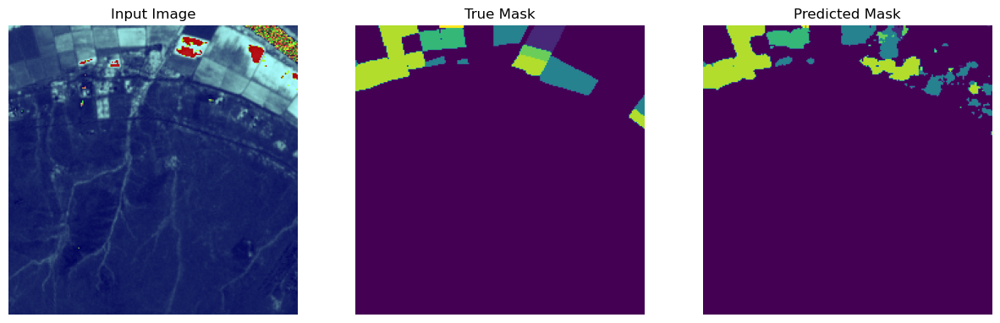

1/1 [==============================] - 0s 121ms/step
['images/tiled/labels_test/tile_2017-07-10_1218.png']
[0 1 4 5 8]
1/1 [==============================] - 0s 95ms/step


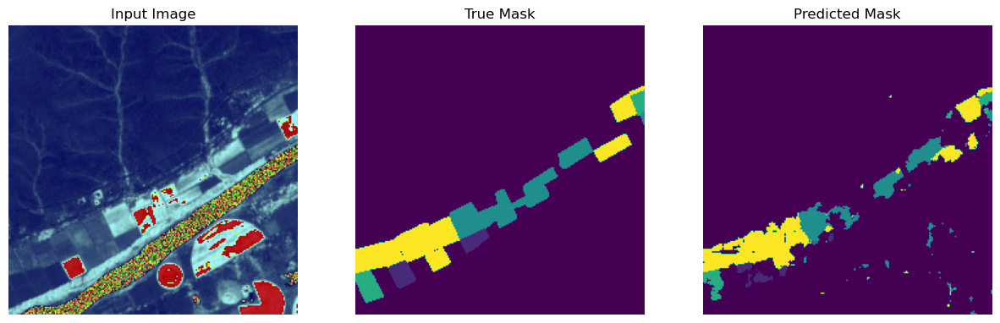

1/1 [==============================] - 0s 113ms/step
['images/tiled/labels_test/tile_2017-07-10_1268.png']
[0 1 2 4 5 8]
1/1 [==============================] - 0s 97ms/step


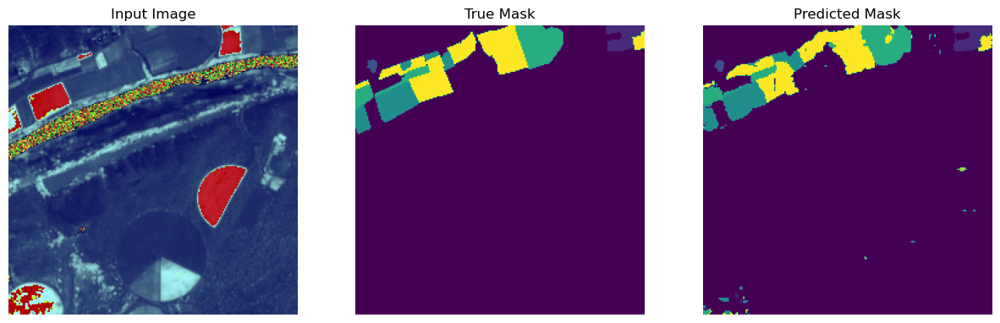

1/1 [==============================] - 0s 83ms/step
['images/tiled/labels_test/tile_2017-07-10_1269.png']
[0 1 3 4 5 8]
1/1 [==============================] - 0s 91ms/step


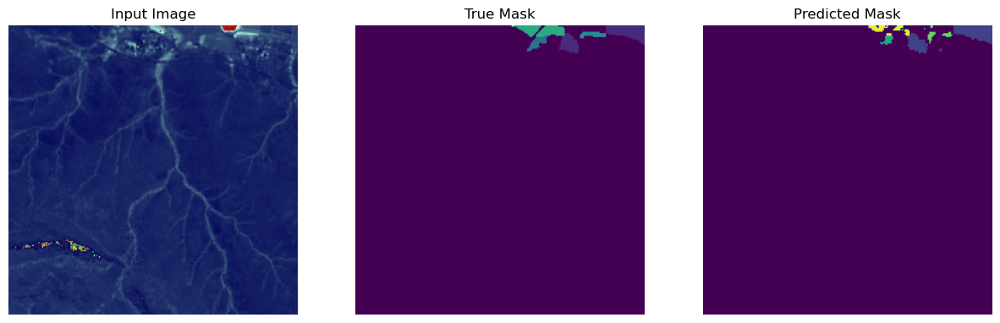

1/1 [==============================] - 0s 73ms/step
['images/tiled/labels_test/tile_2017-07-10_1318.png']
[0 1 4 8]
1/1 [==============================] - 0s 124ms/step


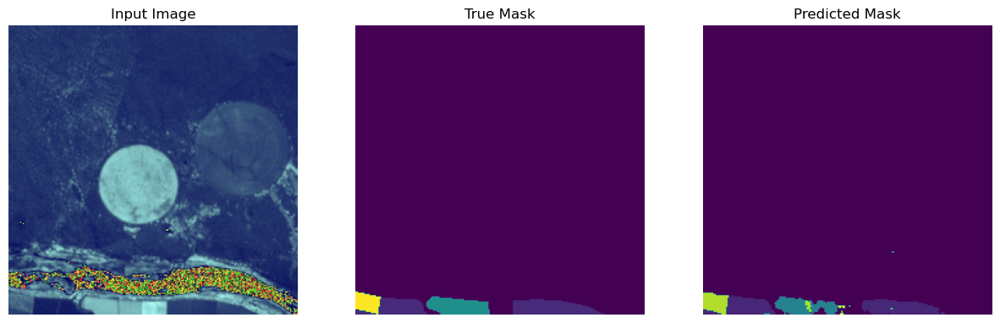

1/1 [==============================] - 0s 88ms/step


In [56]:
tiled_prediction_dir = os.path.join("",'predictions_test/')
if not os.path.exists(tiled_prediction_dir):
    os.makedirs(tiled_prediction_dir)
    
pred_masks = []
true_masks = []

for i in range(0, 20):
    img_num = i

    temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1], 
                                   foreground_list_y[img_num:img_num+1],
                                   preproc_fn=tr_preprocessing_fn,
                                   batch_size=1,
                                   shuffle=False)

    # Let's examine some of these augmented images

    iterator = iter(temp_ds)
    next_element = iterator.get_next()

    batch_of_imgs, label = next_element

    # Running next element in our graph will produce a batch of images

    sample_image, sample_mask = batch_of_imgs[0], label[0, :, :, :]
    sample_mask_int = tf.dtypes.cast(sample_mask, tf.int32)
    true_masks.append(sample_mask_int)
    print(foreground_list_y[img_num:img_num+1])
    print(np.unique(sample_mask_int))

    # run and plot predicitions

    show_predictions()
    pred_mask = get_predictions()
    pred_masks.append(pred_mask)

    # save prediction images to file

    filename_split = os.path.splitext(foreground_list_x[img_num]) 
    filename_zero, fileext = filename_split 
    basename = os.path.basename(filename_zero) 
    tf.keras.preprocessing.image.save_img(tiled_prediction_dir+'/'+basename+".png",pred_mask)

In [287]:
# flatten our tensors and use scikit-learn to create a confusion matrix
flat_preds = tf.reshape(pred_masks, [-1]) 
flat_truth = tf.reshape(true_masks, [-1]) 
cm = confusion_matrix(flat_truth, flat_preds, labels=list(range(OUTPUT_CHANNELS)))

In [58]:
# check values in predicted masks vs truth masks
check_preds = tf.keras.backend.eval(flat_preds)
check_truths = tf.keras.backend.eval(flat_truth)
print(np.unique(check_preds), np.unique(check_truths))

[0 1 2 3 4 5 6 7 8 9] [0 1 2 3 4 5 6 7 8 9]


(9.5, -0.5)

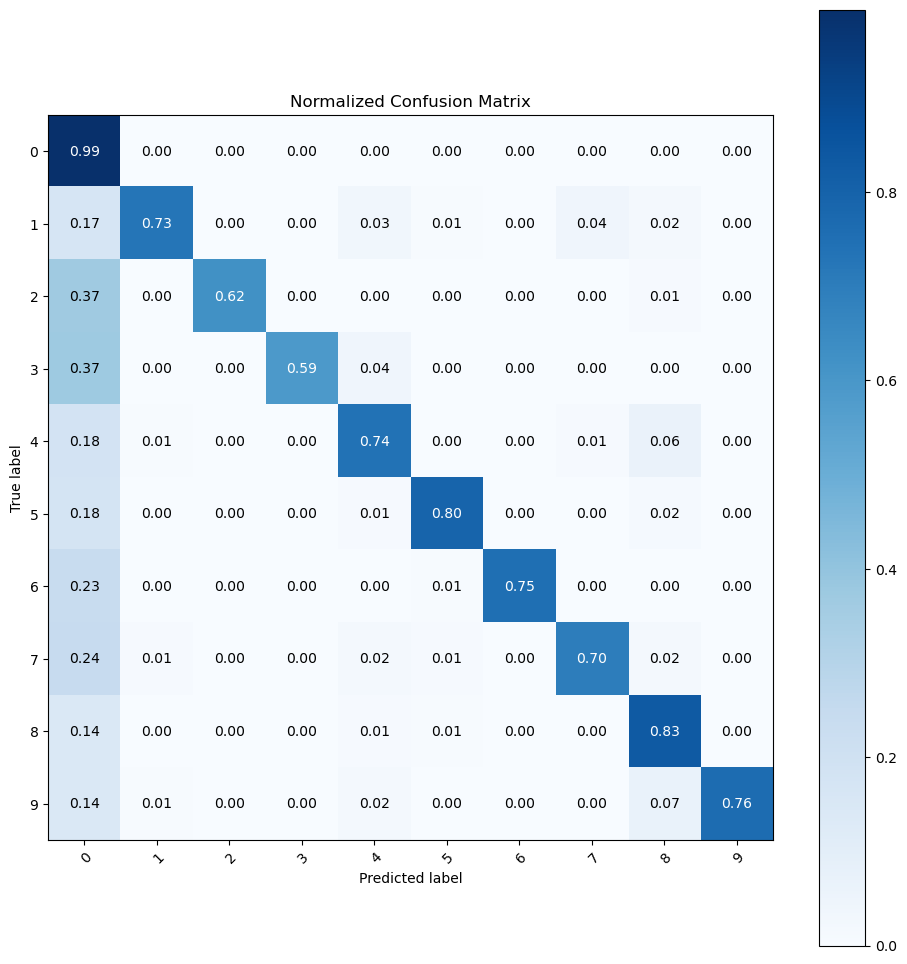

In [59]:
classes = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

%matplotlib inline
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)
# We want to show all ticks...
ax.set(xticks=np.arange(cm.shape[1]),
       yticks=np.arange(cm.shape[0]),
       # ... and label them with the respective list entries
       xticklabels=list(range(OUTPUT_CHANNELS)), yticklabels=list(range(OUTPUT_CHANNELS)),
       title='Normalized Confusion Matrix',
       ylabel='True label',
       xlabel='Predicted label')

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
fmt = '.2f' #'d' # if normalize else 'd'
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], fmt),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")
fig.tight_layout(pad=2.0, h_pad=2.0, w_pad=2.0)
ax.set_ylim(len(classes)-0.5, -0.5)

In [288]:
# compute f1 score
f1_score(flat_truth, flat_preds, average='macro')

0.8169448404460246